# Alzheimer's disease ML model diagnosis and statistical analysis 📈

In [2]:
import pandas as pd 
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC

df = pd.read_csv("Data_Cortex_Nuclear.csv")

In [3]:
df

,MouseID,DYRK1A_N,ITSN1_N,BDNF_N,NR1_N,NR2A_N,pAKT_N,pBRAF_N,pCAMKII_N,pCREB_N,...,pCFOS_N,SYP_N,H3AcK18_N,EGR1_N,H3MeK4_N,CaNA_N,Genotype,Treatment,Behavior,class
0,309_1,0.503644,0.747193,0.430175,2.816329,5.990152,0.218830,0.177565,2.373744,0.232224,...,0.108336,0.427099,0.114783,0.131790,0.128186,1.675652,Control,Memantine,C/S,c-CS-m
1,309_2,0.514617,0.689064,0.411770,2.789514,5.685038,0.211636,0.172817,2.292150,0.226972,...,0.104315,0.441581,0.111974,0.135103,0.131119,1.743610,Control,Memantine,C/S,c-CS-m
2,309_3,0.509183,0.730247,0.418309,2.687201,5.622059,0.209011,0.175722,2.283337,0.230247,...,0.106219,0.435777,0.111883,0.133362,0.127431,1.926427,Control,Memantine,C/S,c-CS-m
3,309_4,0.442107,0.617076,0.358626,2.466947,4.979503,0.222886,0.176463,2.152301,0.207004,...,0.111262,0.391691,0.130405,0.147444,0.146901,1.700563,Control,Memantine,C/S,c-CS-m
4,309_5,0.434940,0.617430,0.358802,2.365785,4.718679,0.213106,0.173627,2.134014,0.192158,...,0.110694,0.434154,0.118481,0.140314,0.148380,1.839730,Control,Memantine,C/S,c-CS-m
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1075,J3295_11,0.254860,0.463591,0.254860,2.092082,2.600035,0.211736,0.171262,2.483740,0.207317,...,0.183324,0.374088,0.318782,0.204660,0.328327,1.364823,Ts65Dn,Saline,S/C,t-SC-s
1076,J3295_12,0.272198,0.474163,0.251638,2.161390,2.801492,0.251274,0.182496,2.512737,0.216339,...,0.175674,0.375259,0.325639,0.200415,0.293435,1.364478,Ts65Dn,Saline,S/C,t-SC-s
1077,J3295_13,0.228700,0.395179,0.234118,1.733184,2.220852,0.220665,0.161435,1.989723,0.185164,...,0.158296,0.422121,0.321306,0.229193,0.355213,1.430825,Ts65Dn,Saline,S/C,t-SC-s
1078,J3295_14,0.221242,0.412894,0.243974,1.876347,2.384088,0.208897,0.173623,2.086028,0.192044,...,0.196296,0.397676,0.335936,0.251317,0.365353,1.404031,Ts65Dn,Saline,S/C,t-SC-s


# Data cleaning and preprocessing 

In [4]:
df.head()

,MouseID,DYRK1A_N,ITSN1_N,BDNF_N,NR1_N,NR2A_N,pAKT_N,pBRAF_N,pCAMKII_N,pCREB_N,...,pCFOS_N,SYP_N,H3AcK18_N,EGR1_N,H3MeK4_N,CaNA_N,Genotype,Treatment,Behavior,class
0,309_1,0.503644,0.747193,0.430175,2.816329,5.990152,0.218830,0.177565,2.373744,0.232224,...,0.108336,0.427099,0.114783,0.131790,0.128186,1.675652,Control,Memantine,C/S,c-CS-m
1,309_2,0.514617,0.689064,0.411770,2.789514,5.685038,0.211636,0.172817,2.292150,0.226972,...,0.104315,0.441581,0.111974,0.135103,0.131119,1.743610,Control,Memantine,C/S,c-CS-m
2,309_3,0.509183,0.730247,0.418309,2.687201,5.622059,0.209011,0.175722,2.283337,0.230247,...,0.106219,0.435777,0.111883,0.133362,0.127431,1.926427,Control,Memantine,C/S,c-CS-m
3,309_4,0.442107,0.617076,0.358626,2.466947,4.979503,0.222886,0.176463,2.152301,0.207004,...,0.111262,0.391691,0.130405,0.147444,0.146901,1.700563,Control,Memantine,C/S,c-CS-m
4,309_5,0.434940,0.617430,0.358802,2.365785,4.718679,0.213106,0.173627,2.134014,0.192158,...,0.110694,0.434154,0.118481,0.140314,0.148380,1.839730,Control,Memantine,C/S,c-CS-m


In [651]:
df.describe(include= "O")

,MouseID,Genotype,Treatment,Behavior,class
count,1080,1080,1080,1080,1080
unique,1080,2,2,2,8
top,309_1,Control,Memantine,S/C,c-CS-m
freq,1,570,570,555,150


In [652]:
df.select_dtypes("number")

,DYRK1A_N,ITSN1_N,BDNF_N,NR1_N,NR2A_N,pAKT_N,pBRAF_N,pCAMKII_N,pCREB_N,pELK_N,...,SHH_N,BAD_N,BCL2_N,pS6_N,pCFOS_N,SYP_N,H3AcK18_N,EGR1_N,H3MeK4_N,CaNA_N
0,0.503644,0.747193,0.430175,2.816329,5.990152,0.218830,0.177565,2.373744,0.232224,1.750936,...,0.188852,0.122652,NaN,0.106305,0.108336,0.427099,0.114783,0.131790,0.128186,1.675652
1,0.514617,0.689064,0.411770,2.789514,5.685038,0.211636,0.172817,2.292150,0.226972,1.596377,...,0.200404,0.116682,NaN,0.106592,0.104315,0.441581,0.111974,0.135103,0.131119,1.743610
2,0.509183,0.730247,0.418309,2.687201,5.622059,0.209011,0.175722,2.283337,0.230247,1.561316,...,0.193685,0.118508,NaN,0.108303,0.106219,0.435777,0.111883,0.133362,0.127431,1.926427
3,0.442107,0.617076,0.358626,2.466947,4.979503,0.222886,0.176463,2.152301,0.207004,1.595086,...,0.192112,0.132781,NaN,0.103184,0.111262,0.391691,0.130405,0.147444,0.146901,1.700563
4,0.434940,0.617430,0.358802,2.365785,4.718679,0.213106,0.173627,2.134014,0.192158,1.504230,...,0.205604,0.129954,NaN,0.104784,0.110694,0.434154,0.118481,0.140314,0.148380,1.839730
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1075,0.254860,0.463591,0.254860,2.092082,2.600035,0.211736,0.171262,2.483740,0.207317,1.057971,...,0.275547,0.190483,NaN,0.115806,0.183324,0.374088,0.318782,0.204660,0.328327,1.364823
1076,0.272198,0.474163,0.251638,2.161390,2.801492,0.251274,0.182496,2.512737,0.216339,1.081150,...,0.283207,0.190463,NaN,0.113614,0.175674,0.375259,0.325639,0.200415,0.293435,1.364478
1077,0.228700,0.395179,0.234118,1.733184,2.220852,0.220665,0.161435,1.989723,0.185164,0.884342,...,0.290843,0.216682,NaN,0.118948,0.158296,0.422121,0.321306,0.229193,0.355213,1.430825
1078,0.221242,0.412894,0.243974,1.876347,2.384088,0.208897,0.173623,2.086028,0.192044,0.922595,...,0.306701,0.222263,NaN,0.125295,0.196296,0.397676,0.335936,0.251317,0.365353,1.404031


In [653]:
df.select_dtypes(include = "O")

,MouseID,Genotype,Treatment,Behavior,class
0,309_1,Control,Memantine,C/S,c-CS-m
1,309_2,Control,Memantine,C/S,c-CS-m
2,309_3,Control,Memantine,C/S,c-CS-m
3,309_4,Control,Memantine,C/S,c-CS-m
4,309_5,Control,Memantine,C/S,c-CS-m
...,...,...,...,...,...
1075,J3295_11,Ts65Dn,Saline,S/C,t-SC-s
1076,J3295_12,Ts65Dn,Saline,S/C,t-SC-s
1077,J3295_13,Ts65Dn,Saline,S/C,t-SC-s
1078,J3295_14,Ts65Dn,Saline,S/C,t-SC-s


In [655]:
df.isnull().sum()

MouseID      0
DYRK1A_N     3
ITSN1_N      3
BDNF_N       3
NR1_N        3
            ..
CaNA_N       0
Genotype     0
Treatment    0
Behavior     0
class        0
Length: 82, dtype: int64

### handling missing NaN values 

In [6]:
# iterate through each protein column and replace missing values with the mean
float_cols = df.select_dtypes(include=['float']).columns

# Replace missing values with column means
for col in float_cols:
    col_mean = df[col].mean()
    df[col].fillna(col_mean, inplace=True)

In [7]:
# looking for balance
for i in ["Genotype", "Treatment", "Behavior", "class"]:
    df[i] = df[i].str.strip("'")
    print(df[i].value_counts())# Observations that are all values should be dropped

Control    570
Ts65Dn     510
Name: Genotype, dtype: int64
Memantine    570
Saline       510
Name: Treatment, dtype: int64
S/C    555
C/S    525
Name: Behavior, dtype: int64
c-CS-m    150
c-SC-m    150
c-CS-s    135
c-SC-s    135
t-CS-m    135
t-SC-m    135
t-SC-s    135
t-CS-s    105
Name: class, dtype: int64


### Preliminary Exploratory Data Analysis 

In [604]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import ipywidgets as widgets
from IPython.display import display

# create dropdown widget for selecting genotype column
genotype_dropdown = widgets.Dropdown(
    options=list(X.columns),
    value=X.columns[-1],
    description='Expression levels:',
)

# define function to update plot based on dropdown value
def update_plot(genotype_col):
    protein = df[[genotype_col, 'class']].dropna()
    sns.boxplot(x='class', y=genotype_col, data=protein, palette = "Set2")

    # Add title and adjust plot layout
    plt.title(genotype_col, fontsize=12)
    plt.tight_layout()
    plt.xticks(rotation = 50, fontsize = 11)
    plt.yticks(fontsize = 11)
    plt.show()

# display the plot and widget
display(genotype_dropdown)
output = widgets.interactive_output(update_plot, {'genotype_col': genotype_dropdown})
display(output)

Dropdown(description='Expression levels:', index=76, options=('DYRK1A_N', 'ITSN1_N', 'BDNF_N', 'NR1_N', 'NR2A_…

Output()

- corr() calculates the Pearson correlation coefficient between all pairs of columns in a DataFrame.

/var/folders/4s/ckx1b8s53t98ygx7px2mcygc0000gn/T/ipykernel_14826/4178346481.py:6: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



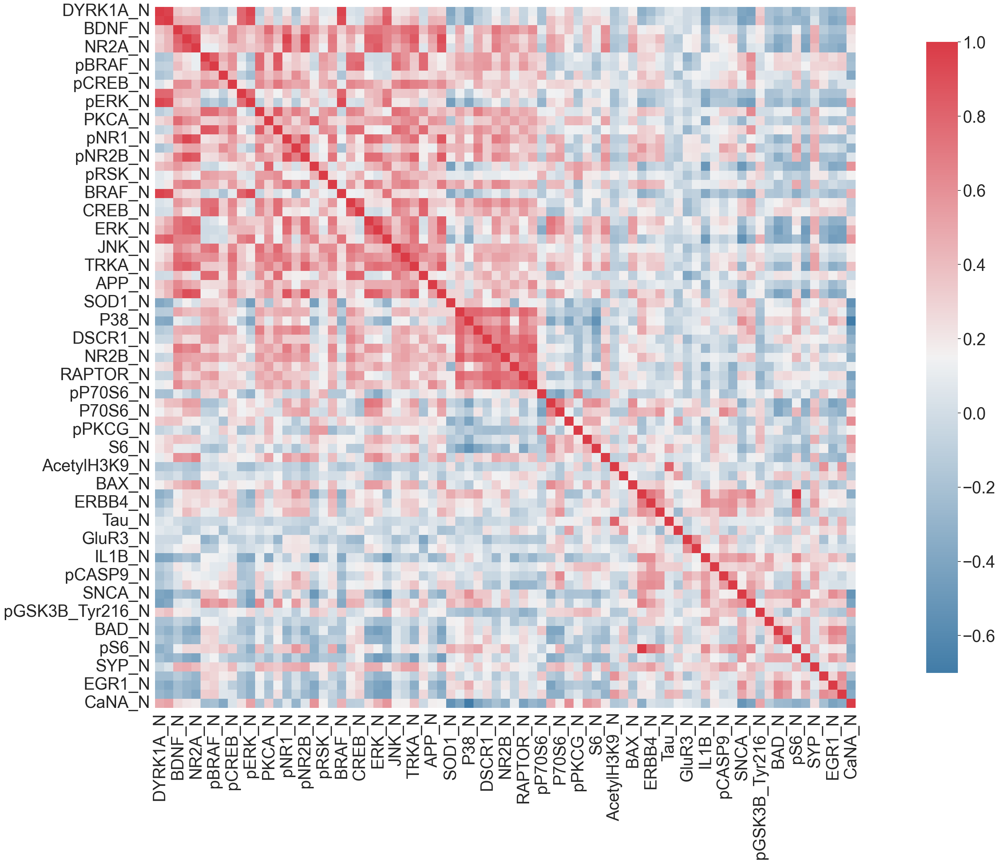

In [658]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_corr(df):
    """Create a heatmap of the correlation matrix for a DataFrame."""
    corr = df.corr()
    cmap = sns.diverging_palette(240, 10, as_cmap=True)
    plt.figure(figsize=(50, 25))
    sns.heatmap(corr, cmap=cmap, square=True, cbar_kws={'shrink': 0.9}, annot=False)
    plt.show()

sns.set(font_scale=3)
plot_corr(df)

# Unsupervised ML

### Clustering Performance analysis 

/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_i

<Axes: xlabel='Num_clusters', ylabel='cluster_errors'>

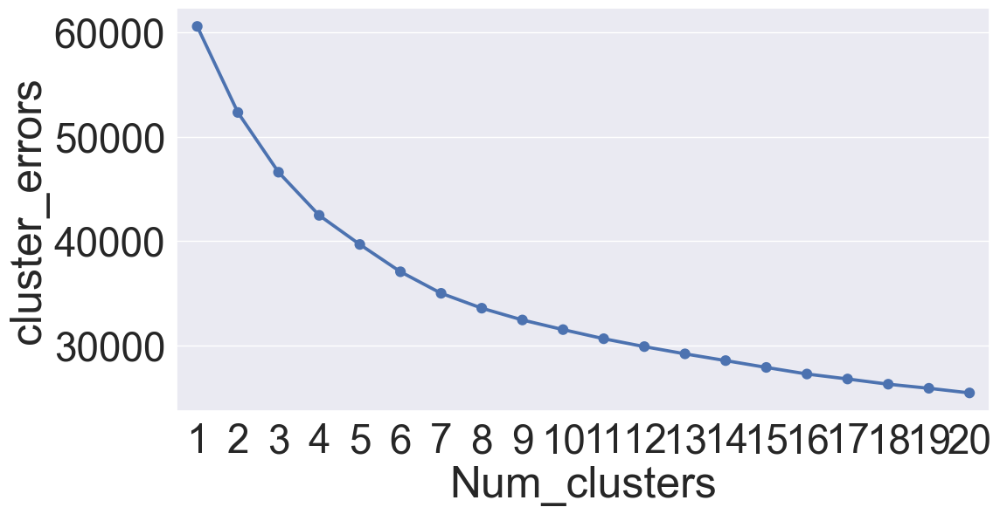

In [659]:
from sklearn.cluster import KMeans
cluster_errors = []

for i in range(1,21):
    clusters = KMeans(i)
    clusters.fit(X_scaled)
    cluster_errors.append(clusters.inertia_)
    
clusters_df = pd.DataFrame({"Num_clusters":range(1,21),"cluster_errors":cluster_errors})
clusters_df[0:12]

sns.pointplot(clusters_df.Num_clusters,clusters_df.cluster_errors,marker=".")

In [660]:
kmeans = KMeans(n_clusters=4)
kmeans.fit(df[num_cols])
cluster_labels = kmeans.labels_

/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



- Calinski-Harabasz index ratio:  between-cluster variance/within-cluster variance, with a higher score indicating better clustering performance.


- The silhouette score ranges from -1 to 1, with higher scores indicating better clustering. A score of 1 means that the data point is well-matched to its own cluster and poorly-matched to neighboring clusters, while a score of -1 means the opposite. A score close to zero indicates that the data point is close to the boundary between two clusters.

/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_i

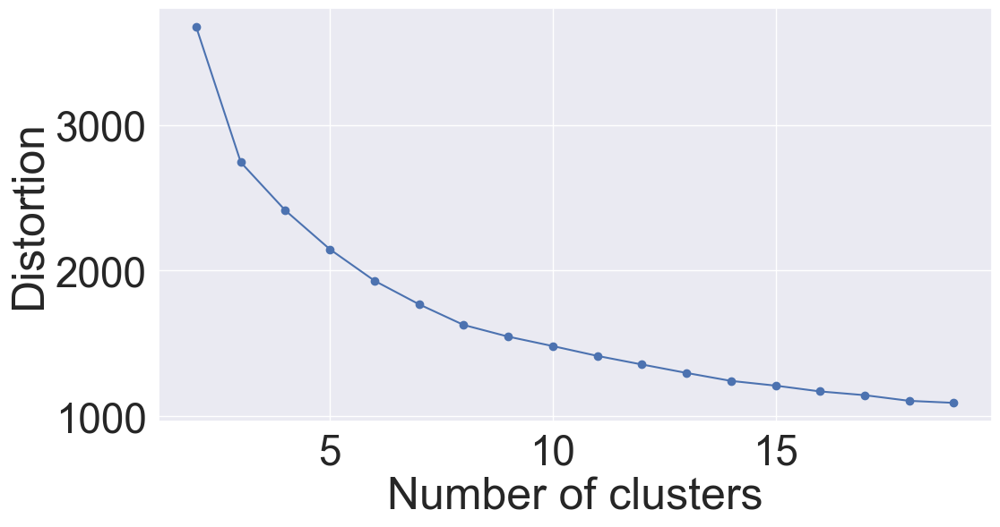

/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_i

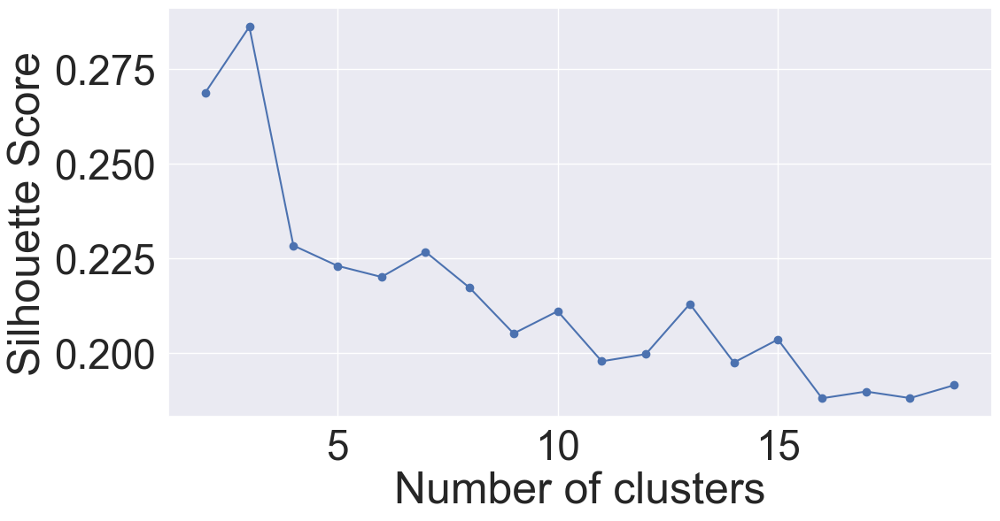

/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_i

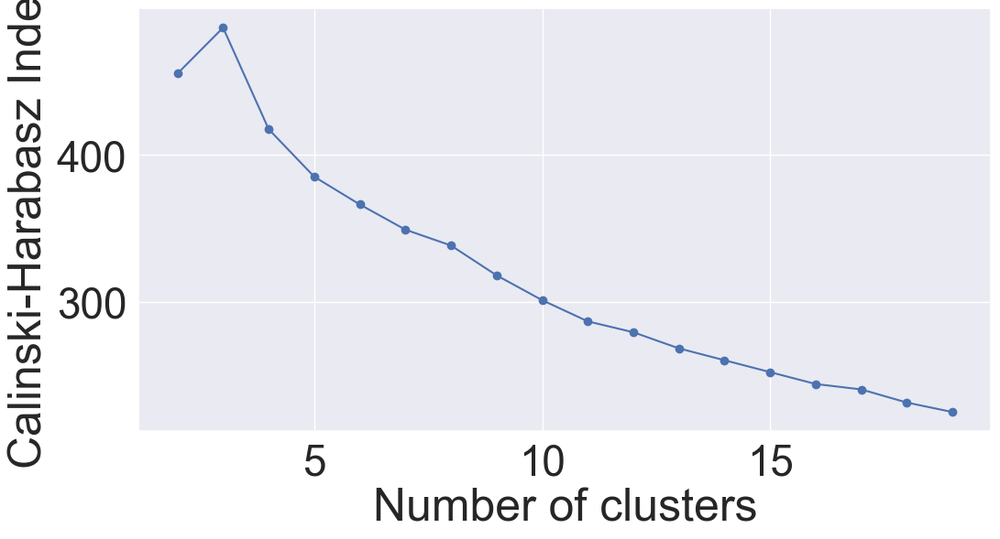

Silhouette score: 0.22377999640897805, Calinski-Harabasz index: 417.54284487695566


/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



In [662]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, calinski_harabasz_score

# Explicitly set n_init to suppress the warning
kmeans = KMeans(n_clusters=3, n_init=10, random_state=42)
cluster_labels = kmeans.fit_predict(df[num_cols])

# Rest of the code remains the same
# choose number of clusters using elbow method
distortions = []
for k in range(2, 20):
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(df[num_cols])
    distortions.append(kmeans.inertia_)
    
import matplotlib.pyplot as plt
plt.plot(range(2, 20), distortions, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Distortion')
plt.show()

# choose number of clusters using silhouette analysis
silhouette_scores = []
for k in range(2, 20):
    kmeans = KMeans(n_clusters=k)
    cluster_labels = kmeans.fit_predict(df[num_cols])
    silhouette_scores.append(silhouette_score(df[num_cols], cluster_labels))

plt.plot(range(2, 20), silhouette_scores, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.show()

# choose number of clusters using Calinski-Harabasz index
ch_scores = []
for k in range(2, 20):
    kmeans = KMeans(n_clusters=k)
    cluster_labels = kmeans.fit_predict(df[num_cols])
    ch_scores.append(calinski_harabasz_score(df[num_cols], cluster_labels))

plt.plot(range(2, 20), ch_scores, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Calinski-Harabasz Index')
plt.show()

# cluster the genes using the chosen number of clusters
k = 4  # chosen number of clusters
kmeans = KMeans(n_clusters=k)
cluster_labels = kmeans.fit_predict(df[num_cols])

# evaluate the quality of clustering
silhouette_avg = silhouette_score(df[num_cols], cluster_labels)
ch_score = calinski_harabasz_score(df[num_cols], cluster_labels)
print(f'Silhouette score: {silhouette_avg}, Calinski-Harabasz index: {ch_score}')

Text(0, 0.5, 'explained_variance_ratio_')

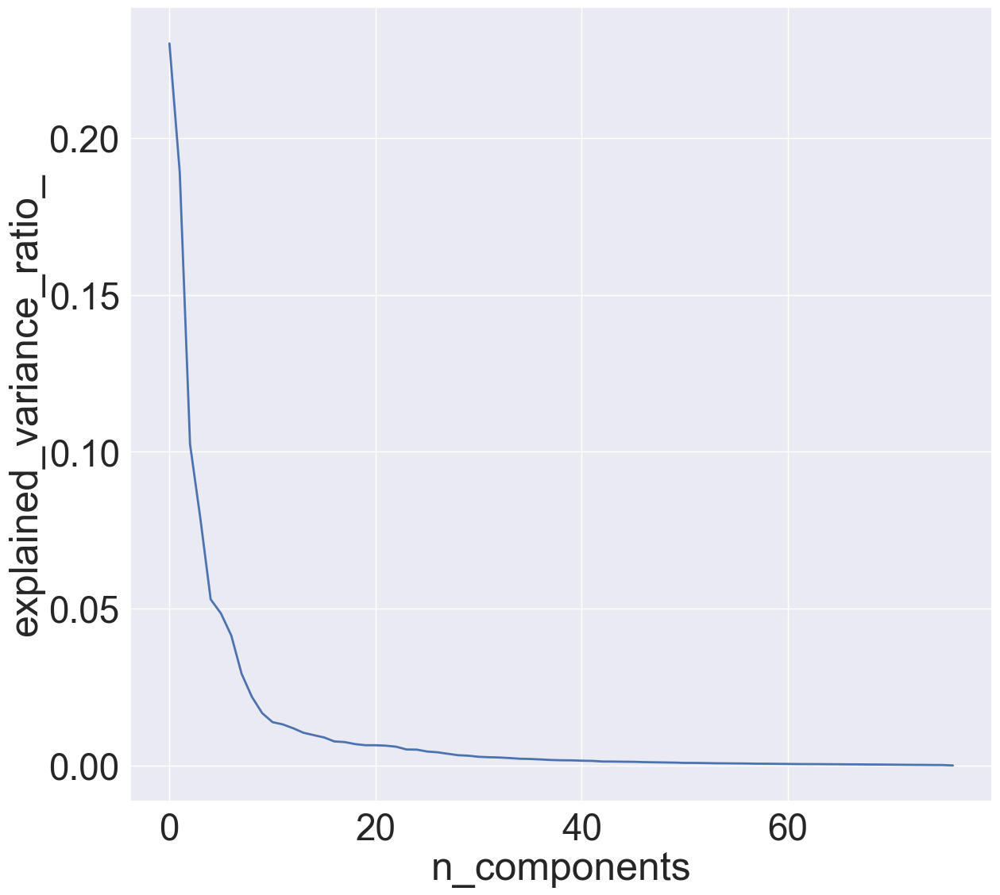

In [663]:
from sklearn.decomposition import PCA
pca = PCA()

X_scaled = scaler.fit_transform(X_train)
pca.fit(X_scaled)

plt.figure(1, figsize=(14, 13))
plt.plot(pca.explained_variance_ratio_, linewidth=2)
plt.xlabel('n_components')
plt.ylabel('explained_variance_ratio_')


### Principal Component Analysis 

In [664]:
from sklearn.decomposition import PCA
import plotly.express as px

pca = PCA(n_components=2)
pca.fit(df[num_cols])
transformed = pca.transform(df[num_cols])
df_pca = pd.DataFrame(data=transformed, columns=["PC1", "PC2"])
df_pca['cluster_labels'] = cluster_labels

fig = px.scatter(df_pca, x="PC1", y="PC2", color="cluster_labels")
fig.show()
fig.write_html("pca.html")

### T-distributed stochastic neighbor embedding

- t-SNE is capable of capturing much of the local structure of the high dimensional data, while also revealing the global structure, such as the presence of clusters at several scales.


In [8]:
from sklearn.preprocessing import RobustScaler
from sklearn.manifold import TSNE
import plotly.express as px

X = df.loc[:, 'DYRK1A_N':'CaNA_N']
y = df['class']

scaler = RobustScaler()
X_scaled = scaler.fit_transform(X)

tsne = TSNE(n_components=2, random_state=42)
tsne_data = tsne.fit_transform(X_scaled)

tsne_data = pd.DataFrame(tsne_data, columns=["t1", "t2"])
tsne_data["class"] = y

fig = px.scatter(tsne_data, x="t1", y="t2", color="class", symbol="class",
                 color_discrete_sequence=px.colors.qualitative.Dark2,
                 symbol_sequence=["circle", "diamond", "square", "cross", "x", "star", "triangle-up", "triangle-down"],
                 title="t-SNE")

fig.show()
fig.write_html("tsne_plot.html")
from IPython.display import IFrame

IFrame(src='./tsne_plot.html', width=700, height=600)

# Feature Engineering 

### Feature importances using ensemble
- preprocessing step: selecting features that are important before fitting the model 

In [608]:
from sklearn.ensemble import RandomForestClassifier
clf = RandomForestClassifier(n_estimators=100, random_state=1, n_jobs=1)
clf.fit(X_train, y_train)

feature_importance = []
#clf.feature_importances_
for i in zip(df.loc[: ,'DYRK1A_N':'CaNA_N'], clf.feature_importances_):
    print(i)

('DYRK1A_N', 0.01867149949951591)
('ITSN1_N', 0.0704722653300567)
('BDNF_N', 0.013242044885520882)
('NR1_N', 0.008059565017997768)
('NR2A_N', 0.009873541323811906)
('pAKT_N', 0.006193482268507673)
('pBRAF_N', 0.004488002310238838)
('pCAMKII_N', 0.020015823857585987)
('pCREB_N', 0.009322008881132061)
('pELK_N', 0.009617783798105123)
('pERK_N', 0.013404861199610641)
('pJNK_N', 0.007563256464108188)
('PKCA_N', 0.014652392254373946)
('pMEK_N', 0.008731934370497553)
('pNR1_N', 0.013118011525145391)
('pNR2A_N', 0.009358938818329844)
('pNR2B_N', 0.008250375747236046)
('pPKCAB_N', 0.010342546224414254)
('pRSK_N', 0.005128609568000678)
('AKT_N', 0.004959728865529589)
('BRAF_N', 0.014411363906823831)
('CAMKII_N', 0.006556644585473081)
('CREB_N', 0.0075945542422831)
('ELK_N', 0.006354857786658152)
('ERK_N', 0.010850381079440611)
('GSK3B_N', 0.010888020817753336)
('JNK_N', 0.008898628353731404)
('MEK_N', 0.004286323478462288)
('TRKA_N', 0.005109505500996332)
('RSK_N', 0.006051729935444376)
('APP_N

### select k-best 

In [609]:
from sklearn.feature_selection import SelectKBest, f_classif

# Univariate feature selection using SelectKBest 
selector = SelectKBest(score_func = f_classif, k = 10)
X_train_new = selector.fit_transform(X_train, y_train)

selected_features = X_train.columns[selector.get_support()]
print("Selected features:", list(selected_features))

# Train a random forest classifier on the selected features
clf = RandomForestClassifier(random_state=42)
clf.fit(X_train_new, y_train)

# Evaluate the performance on the testing set
X_test_new = selector.transform(X_test)
score = clf.score(X_test_new, y_test)
print("Accuracy:", score)

Selected features: ['ITSN1_N', 'pNR2A_N', 'APP_N', 'MTOR_N', 'pPKCG_N', 'S6_N', 'AcetylH3K9_N', 'Tau_N', 'GluR3_N', 'SYP_N']
Accuracy: 0.941358024691358


# Supervised ML
- modeling purpose: AD's diagnosis. Discrimating between healthy and diseased mice

### normalization, splitting, model selection

In [584]:
# prepro
df[['Genotype']].replace(to_replace={'Control':0,'Ts65Dn':1})
df[['Treatment']].replace(to_replace={'Memantine':1,'Saline':0})
df[['Behavior']].replace(to_replace={'S/C':0,'C/S':1})

,Behavior
0,1
1,1
2,1
3,1
4,1
...,...
1075,0
1076,0
1077,0
1078,0


- Train a classification model, such as support vector machines (SVM) or random forest to predict whether a sample is from a patient with Alzheimer's disease or a healthy control.

In [619]:
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import RobustScaler, OneHotEncoder
from imblearn.over_sampling import SMOTE
from sklearn.compose import make_column_transformer
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC

# X and y 
X = df.loc[:, 'DYRK1A_N':'CaNA_N']
y = df['Genotype']
# train, test, split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

scaler = RobustScaler()
X_scaled = scaler.fit_transform(X)

# Create a new DataFrame with the scaled features
df_scaled = pd.DataFrame(X_scaled, columns=X.columns)

# Add the target variable back to the DataFrame
df_scaled['Genotype'] = y

# define the classifier models to loop through
classifiers = {
    "Logistic Regression": LogisticRegression(),
    "Random Forest": RandomForestClassifier(),
    "Gradient Boosting": GradientBoostingClassifier(),
    "SVM": SVC()
}

# use loop to check which model is the best 
results = {}
for classifier in classifiers:
    pipe = make_pipeline(scaler, classifiers[classifier])
    grid = GridSearchCV(
        estimator=pipe, 
        param_grid={}, 
        cv=5, 
        scoring="accuracy"
    )
    grid.fit(X_train, y_train)
    results[classifier] = grid.best_score_
    print(f"Train score for {classifier}: {grid.best_score_}")
    print("")

Train score for Logistic Regression: 0.9695974207040781

Train score for Random Forest: 0.9761850819100731

Train score for Gradient Boosting: 0.9616852561868245

Train score for SVM: 0.9841059602649006



In [465]:
df_scaled = pd.DataFrame(X_scaled, columns=X.columns)

### Cross-validation. `GridSearchCV``

- Cross validation using `GridSearchCV` for hyperparameter tuning. GridSearchCV is a tool in scikit-learn that performs an exhaustive search over a specified parameter grid to find the best parameters for a given estimator.

Best score: 0.9722289996514466
Best parameter: {'logisticregression__C': 10}


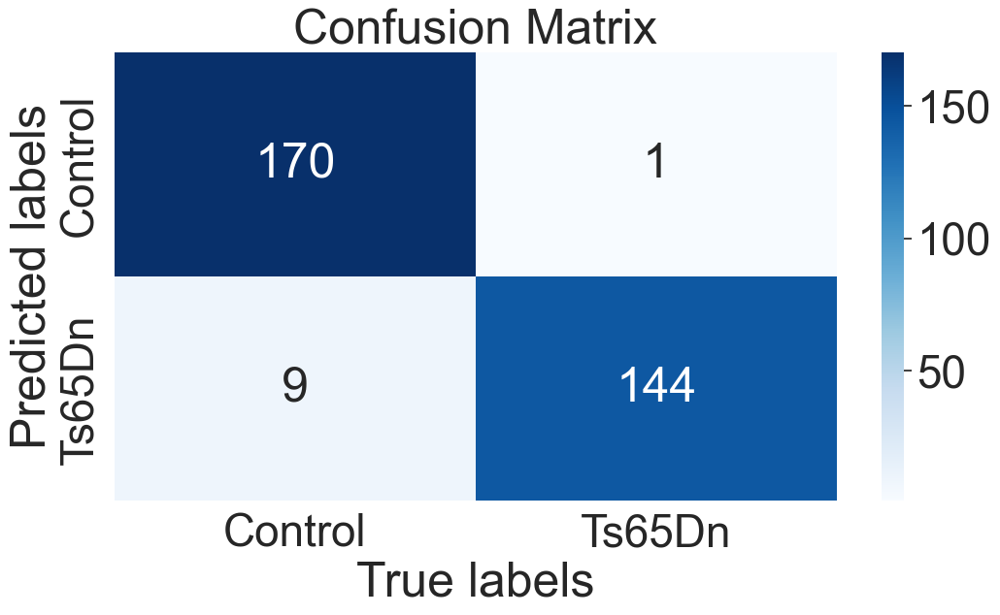

In [469]:
# logistic regression GridSearch 
param_grid_logreg = {
    'logisticregression__C': [0.1, 1, 10, 100, 1000]
    } 
classifier = LogisticRegression(max_iter = 1000)
pipe = make_pipeline(scaler, classifier)

grid_logreg = GridSearchCV(estimator = pipe, 
                          param_grid = param_grid_logreg,
                          cv = 5,
                          scoring = "accuracy")
grid_logreg.fit(X_train, y_train)
print('Best score:', grid_logreg.best_score_)
print('Best parameter:', grid_logreg.best_params_)

y_pred = grid_logreg.predict(X_test)
cm = confusion_matrix(y_pred, predictions)

ax = plt.subplot()
sns.heatmap(cm, annot=True, ax=ax, cmap="Blues", fmt="d",
            xticklabels=grid_logreg.classes_, 
            yticklabels=grid_logreg.classes_,)

ax.set_xlabel("True labels")
ax.set_ylabel("Predicted labels")
ax.set_title("Confusion Matrix")
plt.show()

Best score: 0.9841146741024748
Best parameter: {'randomforestclassifier__max_depth': 50, 'randomforestclassifier__min_samples_leaf': 1, 'randomforestclassifier__n_estimators': 500}


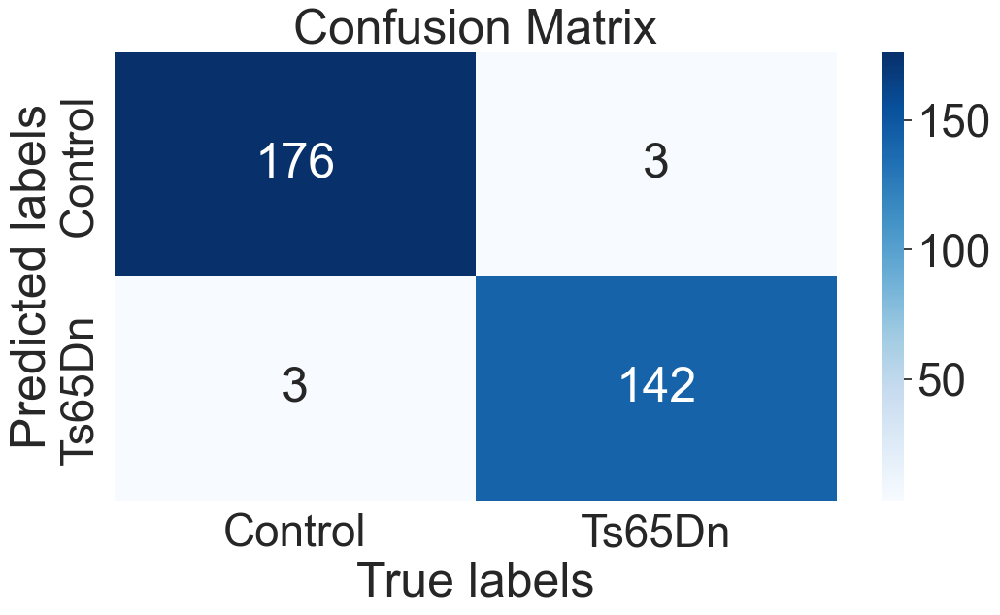

In [480]:
param_grid_rf = {'randomforestclassifier__min_samples_leaf': [1, 2,4 ],
                'randomforestclassifier__max_depth': [10, 50, None],
                'randomforestclassifier__n_estimators': [50, 100, 200, 500]}
classifier = RandomForestClassifier(random_state= 42)
pipe = make_pipeline(scaler, classifier)
grid_rf = GridSearchCV(estimator = pipe,
                      param_grid = param_grid_rf,
                      cv = 5,
                      scoring = "accuracy")
grid_rf.fit(X_train, y_train)

print('Best score:', grid_rf.best_score_)
print('Best parameter:', grid_rf.best_params_)

# confusion matrix rf
y_pred = grid_rf.predict(X_test)
cm = confusion_matrix(y_pred, predictions)

ax = plt.subplot()
sns.heatmap(cm, annot=True, ax=ax, cmap="Blues", fmt="d",
            xticklabels=grid_rf.classes_, 
            yticklabels=grid_rf.classes_,)
ax.set_xlabel("True labels")
ax.set_ylabel("Predicted labels")
ax.set_title("Confusion Matrix")
plt.show()

In [472]:
#pip install scikit-optimize

Best score: 0.9947107005925411
Best parameter: {'svc__C': 0.01, 'svc__gamma': 1, 'svc__kernel': 'poly'}


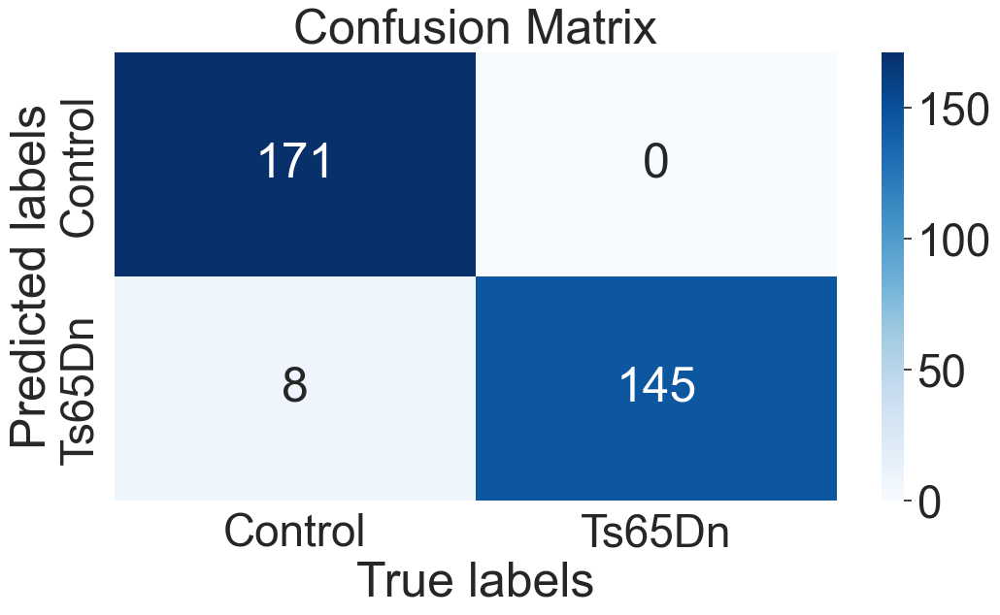

In [492]:
# SVC 
param_grid_svc = {'svc__C': [0.01, 0.1, 1, 10, 100],
                'svc__gamma': [1, 0.1, 0.001, 0.0001],
                'svc__kernel': ['linear','rbf', 'poly', 'sigmoid']
                }
classifier = SVC(random_state = 42)
pipe = make_pipeline(scaler, classifier)
grid_svc = GridSearchCV(estimator = pipe,
                    param_grid = param_grid_svc,
                    cv = 5,
                    scoring = "accuracy",
                    refit = True)
grid_svc.fit(X_train, y_train)
print('Best score:', grid_svc.best_score_)
print('Best parameter:', grid_svc.best_params_)

# confusion matrix rf
y_pred = grid_svc.predict(X_test)
cm = confusion_matrix(y_pred, predictions)

ax = plt.subplot()
sns.heatmap(cm, annot=True, ax=ax, cmap="Blues", fmt="d",
            xticklabels=grid_svc.classes_, 
            yticklabels=grid_svc.classes_,)
ax.set_xlabel("True labels")
ax.set_ylabel("Predicted labels")
ax.set_title("Confusion Matrix")
plt.show()

- prediction models are used to accurately predict the outcome of the patients based on some of their characteristics. 

- With `sub-sampling` at each boosting iteration a fraction η of the training data is sampled without replacement and the tree is grown using only that subsample:

In [623]:
# stochastic gradient boosting
from sklearn.ensemble import StoGradientBoostingClassifier
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import RobustScaler

# define the parameter grid
param_grid_gb = {'n_estimators': [100, 200, 300, 400, 500],
              'learning_rate': [0.001, 0.01, 0.1, 0.2, 0.3],
              'max_depth': [2, 3, 4, 5, 6],
              'min_samples_split': [2, 3, 4, 5, 6, 7, 8, 9, 10],
              'subsample': [0.5, 0.6, 0.7, 0.8, 0.9, 1.0]}

# create a grid search object
grid_gb = GridSearchCV(estimator=GradientBoostingClassifier(),
                     param_grid=param_grid_gb,
                     cv=5,
                     n_jobs=-1)

# fit the grid search object to the training data
grid_gb.fit(X_train, y_train)

# print the best score and parameters
print("Best score:", grid_gb.best_score_)
print("Best parameters:", grid_gb.best_params_)


Best score: 0.9894301150226559
Best parameters: {'learning_rate': 0.3, 'max_depth': 5, 'min_samples_split': 5, 'n_estimators': 200, 'subsample': 0.6}


In [646]:
from sklearn.metrics import classification_report, confusion_matrix

predictions = grid.predict(X_test)
print(classification_report(y_test,predictions))
print(confusion_matrix(y_test, predictions))

report = classification_report(y_test, predictions, output_dict=True)
df = pd.DataFrame(report).transpose()

df

              precision    recall  f1-score   support

     Control       0.96      0.99      0.98       173
      Ts65Dn       0.99      0.95      0.97       151

    accuracy                           0.98       324
   macro avg       0.98      0.97      0.98       324
weighted avg       0.98      0.98      0.98       324

[[172   1]
 [  7 144]]


,precision,recall,f1-score,support
Control,0.960894,0.994220,0.977273,173.000000
Ts65Dn,0.993103,0.953642,0.972973,151.000000
accuracy,0.975309,0.975309,0.975309,0.975309
macro avg,0.976999,0.973931,0.975123,324.000000
weighted avg,0.975905,0.975309,0.975269,324.000000


### classification report 

 
Score for log reg: 0.9567901234567902
With parameters: {'logisticregression__C': 10}

              precision    recall  f1-score   support

     Control       0.96      0.99      0.98       173
      Ts65Dn       0.99      0.95      0.97       151

    accuracy                           0.98       324
   macro avg       0.98      0.97      0.98       324
weighted avg       0.98      0.98      0.98       324

[[172   1]
 [  7 144]]
 
Score for random forest: 0.9753086419753086
With parameters: {'randomforestclassifier__max_depth': 50, 'randomforestclassifier__min_samples_leaf': 1, 'randomforestclassifier__n_estimators': 500}

              precision    recall  f1-score   support

     Control       0.96      0.99      0.98       173
      Ts65Dn       0.99      0.95      0.97       151

    accuracy                           0.98       324
   macro avg       0.98      0.97      0.98       324
weighted avg       0.98      0.98      0.98       324

[[172   1]
 [  7 144]]
 
Score for sv

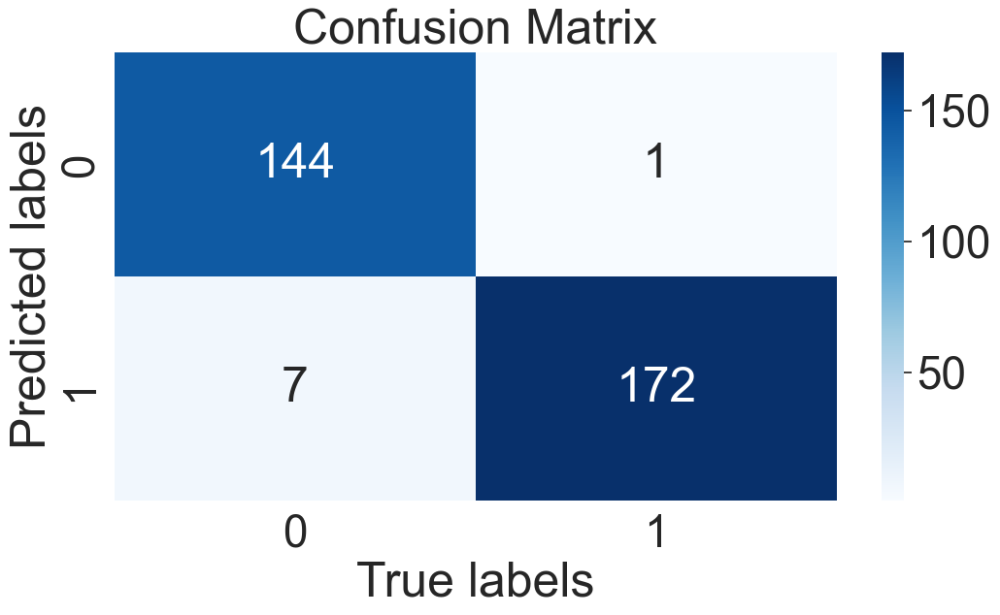

In [624]:
# final evaluation on test data 
results = {}
train_model = {
    "log reg": grid_logreg,
    "random forest": grid_rf,
    "svc": grid_svc,
    "Stochastic Gradient Boosting": grid_gb
}
for name, model in train_model.items():
    score = model.score(X_test, y_test)
    params = model.best_params_
    r = classification_report(y_test,predictions)
    print(r[0][0])
    print(f"Score for {name}: {score}")
    print(f"With parameters: {params}")
    print("")
    results["name"] = score
    
    
    #predictions = grid.predict(X_test)
    print(classification_report(y_test,predictions))
    print(confusion_matrix(y_test, predictions))

   
cm = confusion_matrix(y_test, predictions)
tn, fp, fn, tp = cm[0][0], cm[0][1], cm[1][0], cm[1][1]
labels = ["0", "1"]

new_cm = [[tp, fp], [fn, tn]]
ax = plt.subplot()
sns.heatmap(new_cm, annot=True, ax=ax, cmap="Blues", fmt="d", xticklabels=labels, yticklabels=labels)

ax.set_xlabel("True labels")
ax.set_ylabel("Predicted labels")
ax.set_title("Confusion Matrix")
plt.show()

### model validation 

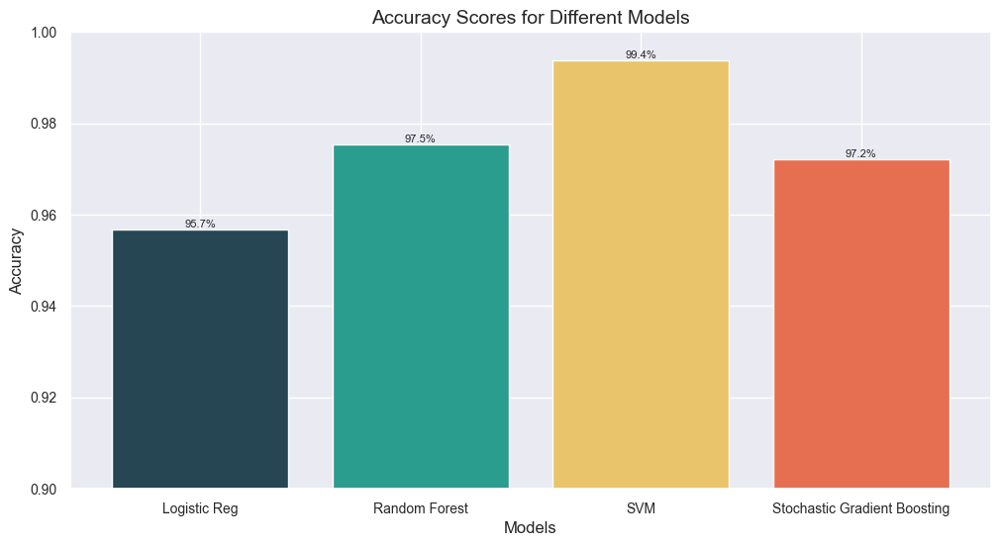

In [630]:
import matplotlib.pyplot as plt

models = ["Logistic Reg", "Random Forest", "SVM", "Stochastic Gradient Boosting"]
scores = [model.score(X_test, y_test) for name, model in train_model.items()]

fig, ax = plt.subplots()
bars = ax.bar(models, scores, color=['#264653', '#2a9d8f', '#e9c46a', '#e76f51'])
ax.set_ylim([0.90, 1.0])
ax.set_ylabel("Accuracy", fontsize=12)
ax.set_xlabel("Models", fontsize=12)
ax.set_title("Accuracy Scores for Different Models", fontsize=14)

for bar in bars:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2., height, '{:.1%}'.format(height), ha='center', va='bottom', fontsize=8)
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10)

plt.tight_layout
plt.show()

# Biomarkers identification and analysis 

In [172]:
# Calculate correlations between Tau_N and all other variables
corr = df.corr()['Tau_N'].sort_values(ascending=False)

# Print the top 10 correlations
print(corr.head(10))

Tau_N           1.000000
AcetylH3K9_N    0.811333
H3AcK18_N       0.496230
S6_N            0.473861
H3MeK4_N        0.442257
ERBB4_N         0.377743
P3525_N         0.310524
NUMB_N          0.300173
GFAP_N          0.238679
RRP1_N          0.233178
Name: Tau_N, dtype: float64


/var/folders/4s/ckx1b8s53t98ygx7px2mcygc0000gn/T/ipykernel_14826/1577170205.py:2: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



- `NR2B_N` is a subunit of the N-methyl-D-aspartate (NMDA) receptor, which plays a key role in synaptic plasticity and memory formation. Dysfunction of the NMDA receptor has been implicated in AD pathogenesis, 
and studies have shown that NR2B levels are decreased in the brains of AD patients (Chen et al., 2014).

- `SOD1_N` is a component of the antioxidant defense system that helps protect cells against 
oxidative stress. Oxidative stress is thought to play a role in the development and progression of AD, 
and studies have shown that SOD1 levels are altered in the brains of AD patients (Mancuso et al., 2010).



In [317]:
# Calculate correlations between MTOR_N and all other variables
corr = df.corr()['MTOR_N'].sort_values(ascending=False)

# Print the top 10 correlations
print(corr.tail(10))

ITSN1_N           -0.120840
pERK_N            -0.127340
AcetylH3K9_N      -0.128040
DYRK1A_N          -0.134906
NUMB_N            -0.148427
pPKCG_N           -0.186351
pGSK3B_N          -0.195468
pGSK3B_Tyr216_N   -0.197559
S6_N              -0.401316
CaNA_N            -0.409921
Name: MTOR_N, dtype: float64


/var/folders/4s/ckx1b8s53t98ygx7px2mcygc0000gn/T/ipykernel_14826/1470795535.py:2: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



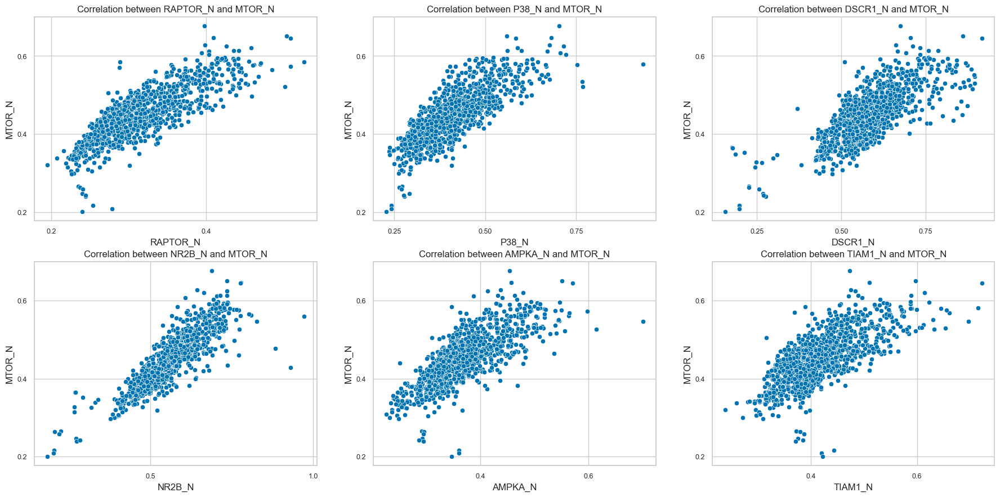

In [319]:
import pandas as pd
import matplotlib.pyplot as plt
from pylab import rcParams

# select top 5 correlated proteins
prot = ['RAPTOR_N', 'P38_N', 'DSCR1_N', 'NR2B_N', 'AMPKA_N', 'TIAM1_N']
rcParams['figure.figsize'] = 12, 6

# create subplots
sns.set_style("whitegrid")
sns.set_palette("colorblind")
plt.figure(figsize=(22, 16))

# create subplots
for idx, protein in enumerate(prot):
    plt.subplot(3,3,idx+1)
    sns.scatterplot(x=protein, y='MTOR_N', data=df)
    plt.xlabel(protein, fontsize=12)
    plt.ylabel('MTOR_N', fontsize=12)
    plt.title('Correlation between ' + protein + ' and MTOR_N', fontsize=12)
    plt.xticks(fontsize=9)
    plt.yticks(fontsize=9)

# add spacing between subplots
fig.tight_layout()
plt.show()


### Linear Regression

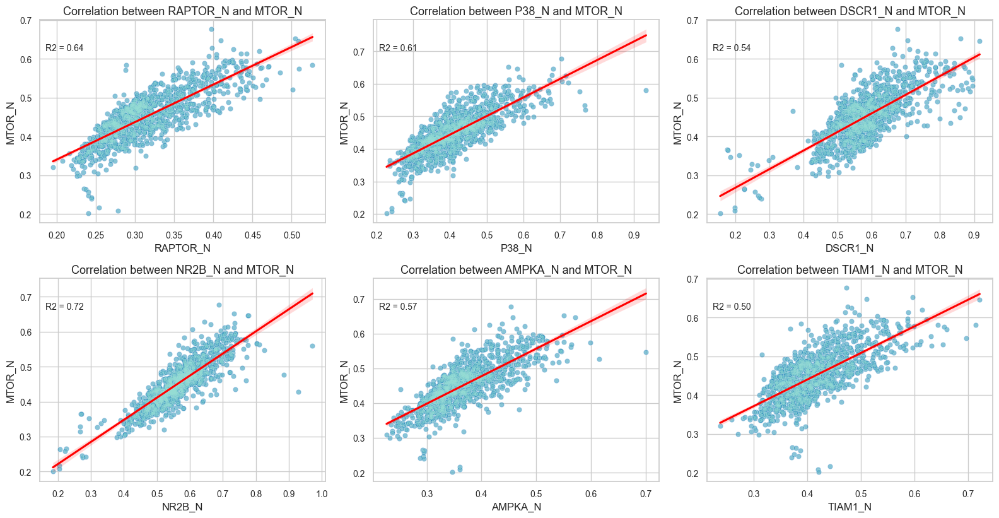

In [368]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import r2_score
import numpy as np

# select top 5 correlated proteins
prot = ['RAPTOR_N', 'P38_N', 'DSCR1_N', 'NR2B_N', 'AMPKA_N', 'TIAM1_N']

# set figure size and style
plt.figure(figsize=(16, 12))
sns.set_style("whitegrid")
sns.set_palette("colorblind")

# create subplots
for idx, protein in enumerate(prot):
    row, col = divmod(idx, 3)
    ax = plt.subplot2grid((3, 3), (row, col))
    sns.scatterplot(x=protein, y='MTOR_N', data=df, ax=ax, alpha=0.5)
    sns.regplot(x=protein, y='MTOR_N', data=df, ax=ax, 
                scatter_kws={"color": "#98DFD6", 's':10, 'alpha':0.3},
                line_kws={"color": "red"})

    ax.set_xlabel(protein, fontsize=12)
    ax.set_ylabel('MTOR_N', fontsize=12)
    ax.set_title('Correlation between ' + protein + ' and MTOR_N', fontsize=13)
    ax.tick_params(axis='both', labelsize=10)
    x = df[protein]
    y = df['MTOR_N']
    r2 = r2_score(y, np.polyval(np.polyfit(x, y, 1), x))
    ax.text(0.02, 0.85, f"R2 = {r2:.2f}", transform=ax.transAxes, fontsize=10)
    
# add spacing between subplots
plt.tight_layout()
plt.show()

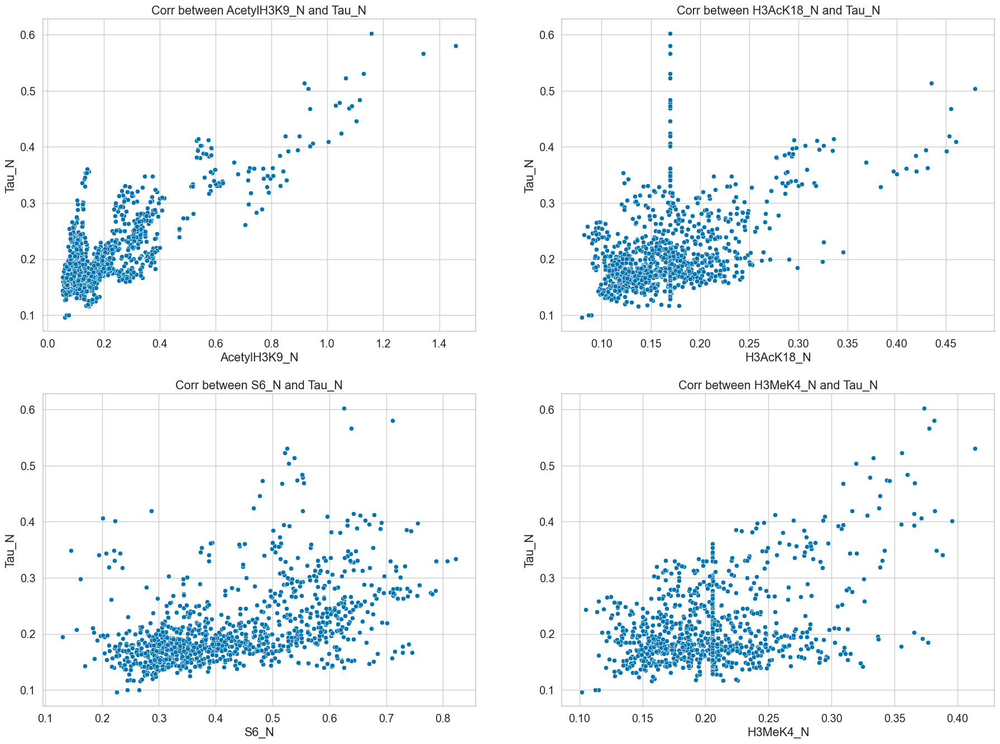

In [183]:
import pandas as pd
import matplotlib.pyplot as plt
from pylab import rcParams

# select top 5 correlated proteins
prot = ['AcetylH3K9_N', 'H3AcK18_N', 'S6_N', 'H3MeK4_N']
rcParams['figure.figsize'] = 12, 6

# create subplots
sns.set_style("whitegrid")
sns.set_palette("colorblind")
plt.figure(figsize=(22, 16))

# create subplots
for idx, protein in enumerate(prot):
    plt.subplot(2, 2, idx+1)
    sns.scatterplot(x=protein, y='Tau_N', data=df)
    plt.xlabel(protein)
    plt.ylabel('Tau_N')
    plt.title('Corr between ' + protein + ' and Tau_N')
# add spacing between subplots

fig.tight_layout()
plt.show()



### Pairwise Euclidean Distances

In [212]:
from scipy.spatial.distance import pdist, squareform
num_cols = ['DYRK1A_N', 'ITSN1_N', 'BDNF_N', 'NR1_N', 'NR2A_N', 'pAKT_N', 'pBRAF_N', 'pCAMKII_N', 'pCREB_N', 'pELK_N', 'pERK_N', 'pJNK_N', 'PKCA_N', 'pMEK_N', 'pNR1_N', 'pNR2A_N', 'pNR2B_N', 'pPKCAB_N', 'pRSK_N', 'AKT_N', 'BRAF_N', 'CAMKII_N', 'CREB_N', 'ELK_N', 'ERK_N', 'GSK3B_N', 'JNK_N', 'MEK_N', 'TRKA_N', 'RSK_N', 'APP_N', 'Bcatenin_N', 'SOD1_N', 'MTOR_N', 'P38_N', 'pMTOR_N', 'DSCR1_N', 'AMPKA_N', 'NR2B_N', 'pNUMB_N', 'RAPTOR_N', 'TIAM1_N', 'pP70S6_N', 'NUMB_N', 'P70S6_N', 'pGSK3B_N', 'pCASP9_N', 'PSD95_N', 'SNCA_N', 'Ubiquitin_N', 'pGSK3B_Tyr216_N', 'SHH_N', 'BAD_N', 'BCL2_N', 'pS6_N', 'pCFOS_N', 'SYP_N', 'H3AcK18_N', 'EGR1_N', 'H3MeK4_N', 'CaNA_N']

# Calculate pairwise Euclidean distances
distances = pdist(df[num_cols], metric='euclidean')

# Convert the pairwise distances into a square matrix
dist_matrix = squareform(distances)
dist_matrix

array([[0.        , 0.56449809, 0.65308777, ..., 5.44261881, 5.18385591,
        4.69747057],
       [0.56449809, 0.        , 0.25531637, ..., 4.96338847, 4.70893082,
        4.23895674],
       [0.65308777, 0.25531637, 0.        , ..., 4.95008902, 4.69880175,
        4.23449596],
       ...,
       [5.44261881, 4.96338847, 4.95008902, ..., 0.        , 0.35331224,
        0.98034947],
       [5.18385591, 4.70893082, 4.69880175, ..., 0.35331224, 0.        ,
        0.68535386],
       [4.69747057, 4.23895674, 4.23449596, ..., 0.98034947, 0.68535386,
        0.        ]])

- subtracting the value of gene i from gene j,
squaring it in each sample, and then taking the square root of the sum

Text(0.5, 1.0, 'Pairwise Euclidean Distances')

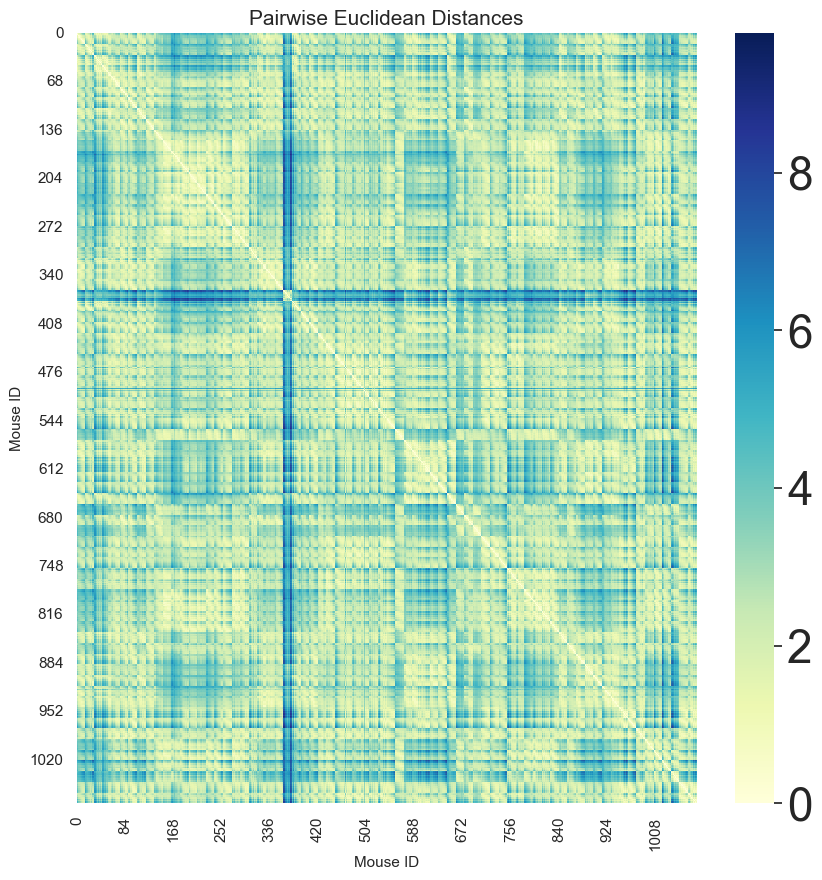

In [219]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a figure and axis object
fig, ax = plt.subplots(figsize=(10, 10))

# Create the heatmap using seaborn
sns.heatmap(dist_matrix, cmap="YlGnBu", ax=ax)

# Set the axis labels and title
ax.set_xlabel("Mouse ID", fontsize = 11)
ax.set_ylabel("Mouse ID", fontsize = 11)
plt.xticks(fontsize = 11)
plt.yticks(fontsize = 11)

ax.set_title("Pairwise Euclidean Distances", fontsize = 15)

### Volcano plot (DEGs)

- volcano plots is a popular visualization tool used in gene expression data analysis to identify differentially expressed genes (DEGs) between two groups of samples, such as treatment vs. control, disease vs. healthy, or different tissue types. The volcano plot represents the relationship between the statistical significance (e.g., p-value) of gene expression changes on the y-axis and the magnitude of change (e.g., fold change) on the x-axis.

In [643]:
import numpy as np
from bokeh.io import output_notebook, show
from bokeh.models import ColumnDataSource, HoverTool
from bokeh.plotting import figure

# Get columns for volcano plot
num_cols = ['DYRK1A_N', 'ITSN1_N', 'BDNF_N', 'NR1_N', 'NR2A_N', 'pAKT_N', 'pBRAF_N', 'pCAMKII_N', 'pCREB_N', 'pELK_N', 'pERK_N', 'pJNK_N', 'PKCA_N', 'pMEK_N', 'pNR1_N', 'pNR2A_N', 'pNR2B_N', 'pPKCAB_N', 'pRSK_N', 'AKT_N', 'BRAF_N', 'CAMKII_N', 'CREB_N', 'ELK_N', 'ERK_N', 'GSK3B_N', 'JNK_N', 'MEK_N', 'TRKA_N', 'RSK_N', 'APP_N', 'Bcatenin_N', 'SOD1_N', 'MTOR_N', 'P38_N', 'pMTOR_N', 'DSCR1_N', 'AMPKA_N', 'NR2B_N', 'pNUMB_N', 'RAPTOR_N', 'TIAM1_N', 'pP70S6_N', 'NUMB_N', 'P70S6_N', 'pGSK3B_N', 'pCASP9_N', 'PSD95_N', 'SNCA_N', 'Ubiquitin_N', 'pGSK3B_Tyr216_N', 'SHH_N', 'BAD_N', 'BCL2_N', 'pS6_N', 'pCFOS_N', 'SYP_N', 'H3AcK18_N', 'EGR1_N', 'H3MeK4_N', 'CaNA_N']

# Calculate fold changes and p-values
fold_changes = np.log2(df.groupby('class')[num_cols].mean().loc['c-SC-m'] / df.groupby('class')[num_cols].mean().loc['c-CS-m'])
pvals = -np.log10(stats.ttest_ind(df.loc[df['class'] == 'c-SC-m', num_cols], df.loc[df['class'] == 'c-CS-m', num_cols]).pvalue)

# Define the data source
source = ColumnDataSource(data=dict(fold_changes=fold_changes, pvals=pvals, genes=num_cols))

# Define hover tool
hover = HoverTool(tooltips=[
    ("Gene", "@genes"),
    ("Fold Change", "@fold_changes"),
    ("-log10 p-value", "@pvals")
])

# Create the plot
p = figure(title='Volcano Plot of Gene Expression Data', tools=[hover])
p.scatter(x='fold_changes', y='pvals', source=source, size=10, alpha=0.5)
p.line([np.min(fold_changes), np.max(fold_changes)], [-np.log10(0.05), -np.log10(0.05)], line_dash="dashed", line_color="grey")
p.line([0, 0], [0, np.max(pvals)], line_dash="dashed", line_color="grey")
p.xaxis.axis_label = 'log2 fold change'
p.yaxis.axis_label = '-log10 p-value'

# Show the plot
output_notebook()
show(p)

Loading BokehJS ...

### Normalized Enrichment Score 

- Normalized Enrichment Score (NES) is an important metric used in gene expression analysis to evaluate the significance of differentially expressed genes or proteins in a particular biological process or pathway.


- The `NES is a normalized score` that takes into account the size of the gene set, the degree of differential expression of individual genes in the set, and the distribution of the gene expression values. It provides a more robust and biologically relevant measure of the significance of a gene set's enrichment compared to other methods

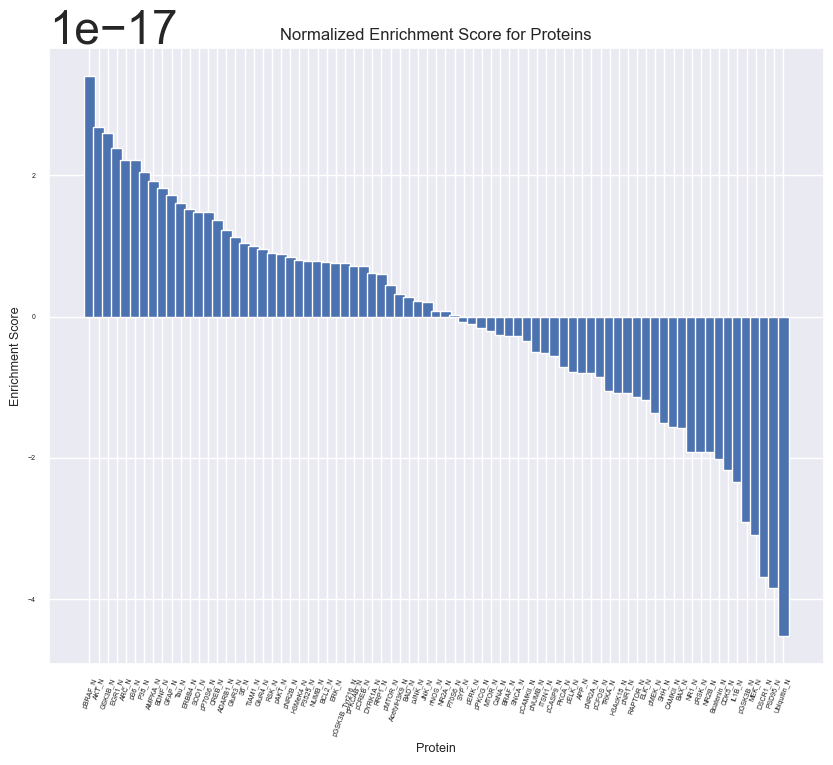

In [616]:
proteins = df.columns[1:78]

# Normalize the data
normalized_data = (df[proteins] - df[proteins].mean()) / df[proteins].std()

# Calculate the enrichment score for each protein
enrichment_scores = normalized_data.mean() / np.sqrt(normalized_data.shape[0])

# Sort the enrichment scores in descending order
enrichment_scores = enrichment_scores.sort_values(ascending=False)

# Plot the enrichment scores
plt.figure(figsize=(10, 8))
plt.bar(enrichment_scores.index, enrichment_scores, width=1.2)
plt.xticks(rotation=90)
plt.xlabel('Protein', fontsize = 9)
plt.ylabel('Enrichment Score', fontsize = 9)
plt.title('Normalized Enrichment Score for Proteins', fontsize = 12)
plt.xticks(fontsize = 5, rotation = 70)
plt.yticks(fontsize = 5)

plt.show()

In [92]:
enrichment_scores = np.array([ 3.49856310e-18,  2.19909681e-18,  3.59852205e-17, -3.99835783e-18,
       -1.55935955e-17,  1.13953198e-17, -4.79802940e-18, -5.19786518e-18,
        2.71888333e-17, -3.19868627e-18,  3.99835783e-19,  2.23908039e-17,
       -3.19868627e-18, -1.27947451e-17,  3.99835783e-18,  0.00000000e+00,
       -1.07955661e-17,  1.19950735e-17,  7.99671566e-19,  6.19745464e-18,
        2.39901470e-18, -3.79843994e-18,  1.77926923e-17, -1.13953198e-17,
       -1.59934313e-18,  1.27947451e-17,  2.59893259e-18, -2.57894080e-17,
        6.69724937e-18, -1.57935134e-17, -7.99671566e-19,  1.33944987e-17,
        9.59605880e-18,  1.43940882e-17,  2.19909681e-17,  3.19868627e-18,
       -1.36943756e-17, -2.83883406e-17,  7.19704410e-18,  2.75886690e-17,
        2.45899007e-17,  6.99712620e-18,  5.59770096e-18, -1.63932671e-17,
       -6.19745464e-18, -9.99589458e-18, -8.79638723e-18, -3.61851384e-17,
       -2.39901470e-18, -1.01958125e-17,  7.99671566e-19,  2.01917070e-17,
       -9.59605880e-18,  2.57894080e-17, -5.71765170e-17,  2.22908449e-17,
        3.19868627e-18, -3.23866984e-17,  7.19704410e-18, -3.94837836e-18,
        2.93879301e-17, -3.29864521e-17,  2.13912144e-17, -4.59811151e-18,
        1.59934313e-18, -2.74887101e-17,  4.19827572e-18, -1.12953609e-17,
        1.09954840e-18,  1.07455867e-17,  2.57894080e-17,  3.19868627e-18,
       -1.75927745e-17, -7.99671566e-19,  3.59852205e-18,  5.19786518e-18,
        1.99917892e-19])

In [132]:
fold_changes.sort_values(ascending= False)

SOD1_N       0.908492
pCAMKII_N    0.699686
pNR2A_N      0.402979
pP70S6_N     0.383998
H3AcK18_N    0.306387
               ...   
ITSN1_N     -0.580649
CaNA_N      -0.593246
BRAF_N      -0.687604
DYRK1A_N    -0.814433
pERK_N      -0.963013
Length: 61, dtype: float64

# Exploratory data analysis of gene expression data

In [617]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import ipywidgets as widgets
from IPython.display import display

# create dropdown widget for selecting genotype column
genotype_dropdown = widgets.Dropdown(
    options=list(X.columns),
    value=X.columns[-1],
    description='Expression levels:',
)

# define function to update plot based on dropdown value
def update_plot(genotype_col):
    protein = df[[genotype_col, 'class']].dropna()
    sns.boxplot(x='class', y=genotype_col, data=protein, palette = "Set2")

    # Add title and adjust plot layout
    plt.title(genotype_col, fontsize=12)
    plt.tight_layout()
    plt.xticks(rotation = 50, fontsize = 11)
    plt.yticks(fontsize = 11)
    plt.show()

# display the plot and widget
display(genotype_dropdown)
output = widgets.interactive_output(update_plot, {'genotype_col': genotype_dropdown})
display(output)

Dropdown(description='Expression levels:', index=76, options=('DYRK1A_N', 'ITSN1_N', 'BDNF_N', 'NR1_N', 'NR2A_…

Output()

### Interactive histograms of Gene expression data 

In [618]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from ipywidgets import interact

# Define the function to create the histograms
def create_histogram(column, bins):
    # Filter the data based on the selected column
    values = df[column].dropna()
    
    # Create the histogram
    plt.hist(values, bins=bins, color = #)
    plt.xlabel(column)
    plt.show()

# Create the interactive controls
columns = df.columns[1:-4]  # Exclude the first and last 4 columns
#bins = np.arange(0, 3, 0.1)
interact(create_histogram, column=columns, bins=15)

interactive(children=(Dropdown(description='column', options=('DYRK1A_N', 'ITSN1_N', 'BDNF_N', 'NR1_N', 'NR2A_…

<function __main__.create_histogram(column, bins)>

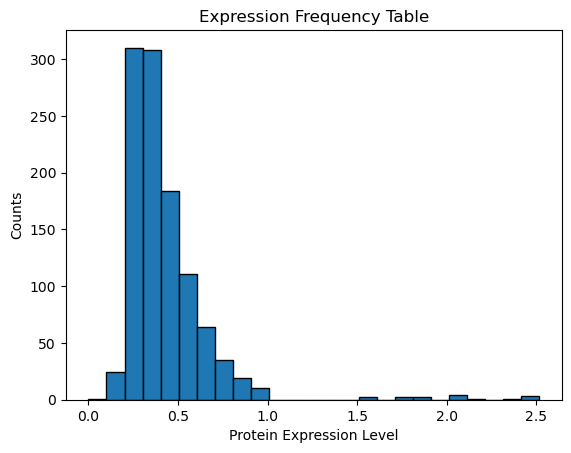

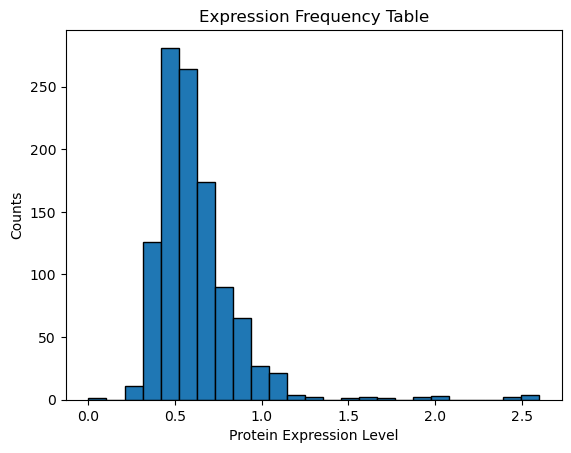

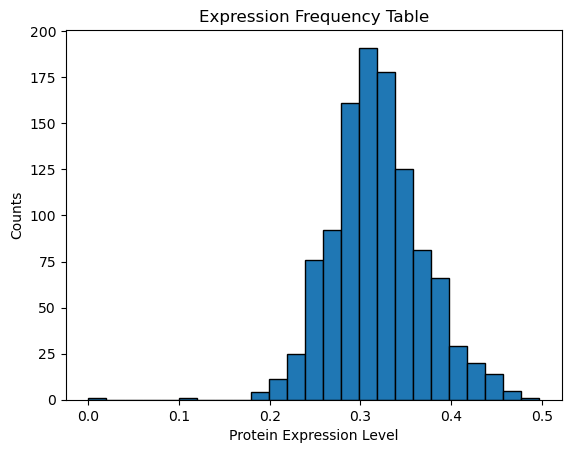

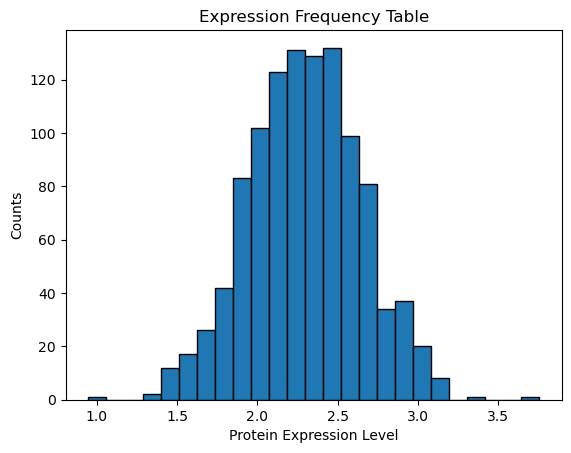

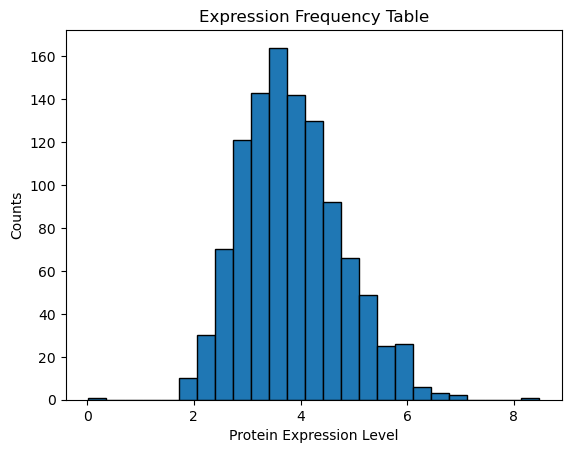

...

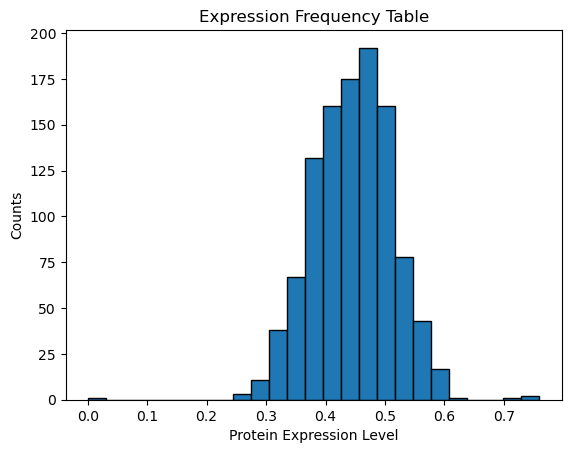

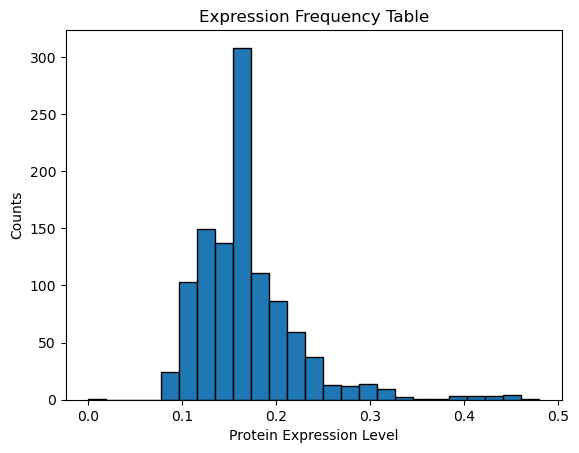

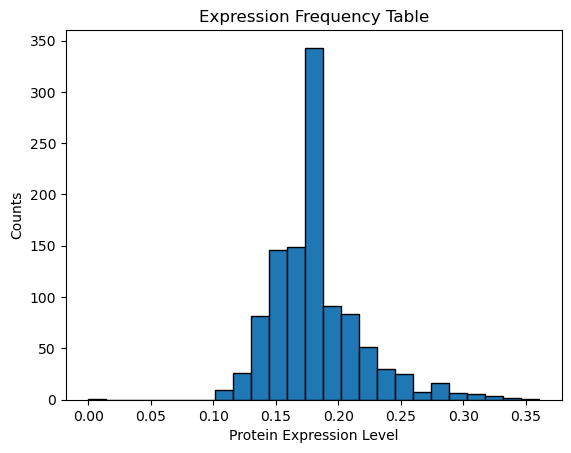

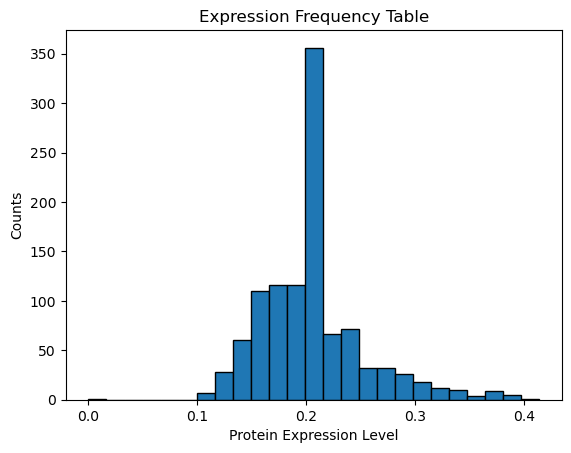

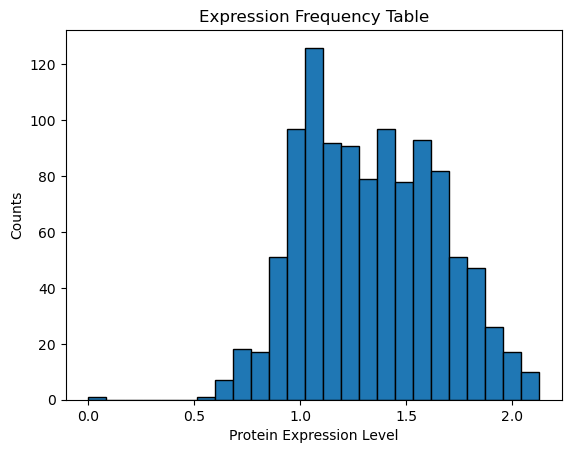

In [168]:
# Histogram of protein expression level - DYRK1A
for i in df.columns:
    if i.endswith("_N"):
        protein = df[i].dropna()
        plt.hist(protein, bins=25, edgecolor='black')
        plt.title('Expression Frequency Table')
        plt.xlabel('Protein Expression Level')
        plt.ylabel('Counts')
        plt.show()

# Statistical analysis 

### is the data normally distributed?
    - QQ plots
    - Shapiro-Wilk test
    

- A QQ plot (quantile-quantile plot) is a type of graphical tool used to compare the distribution of a sample dataset to a theoretical distribution, such as a normal distribution. 
- identify whether the sample data has unusual outliers, skewed tails, or other features that may affect its distribution.

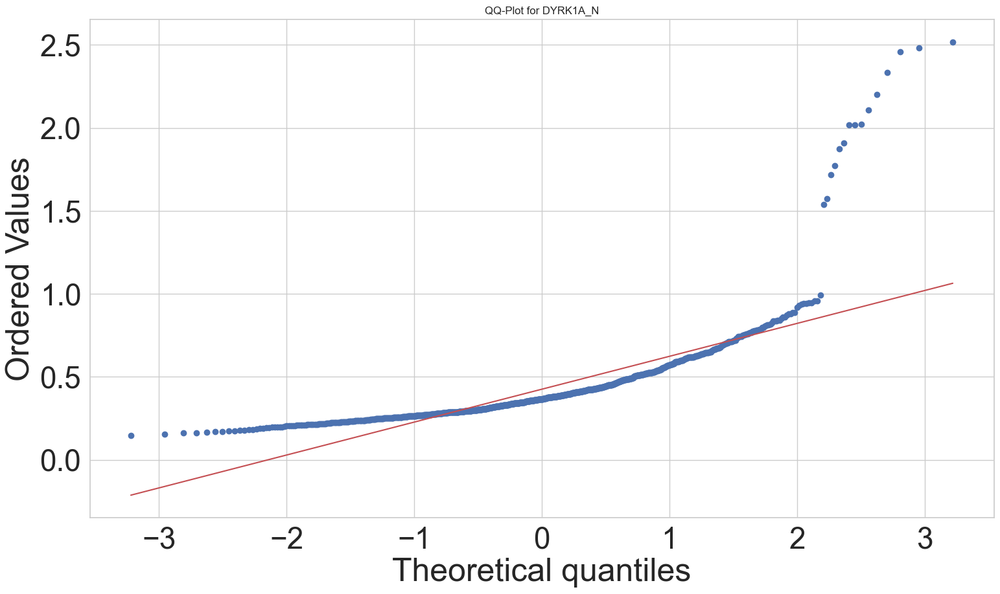

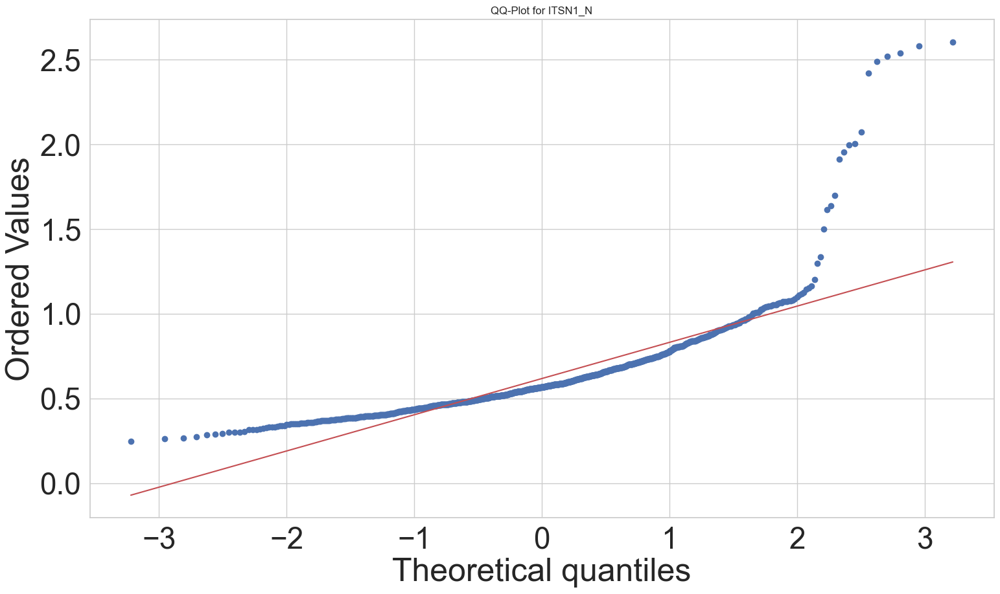

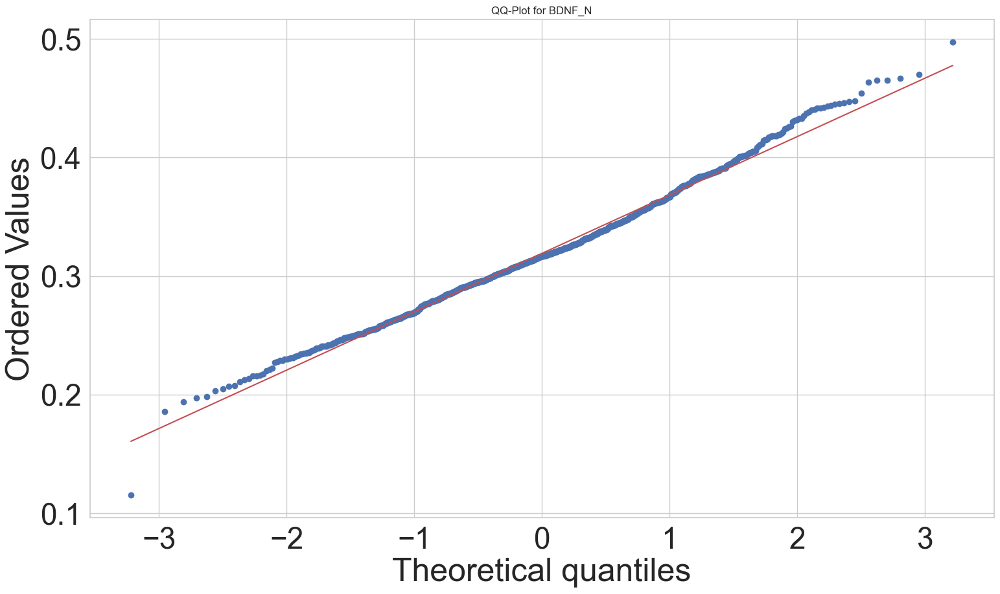

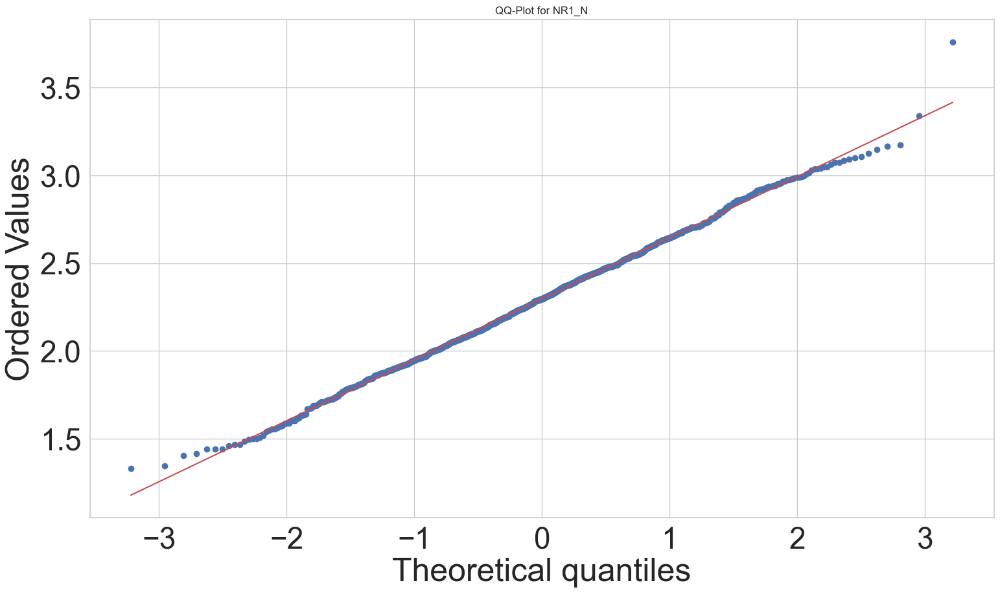

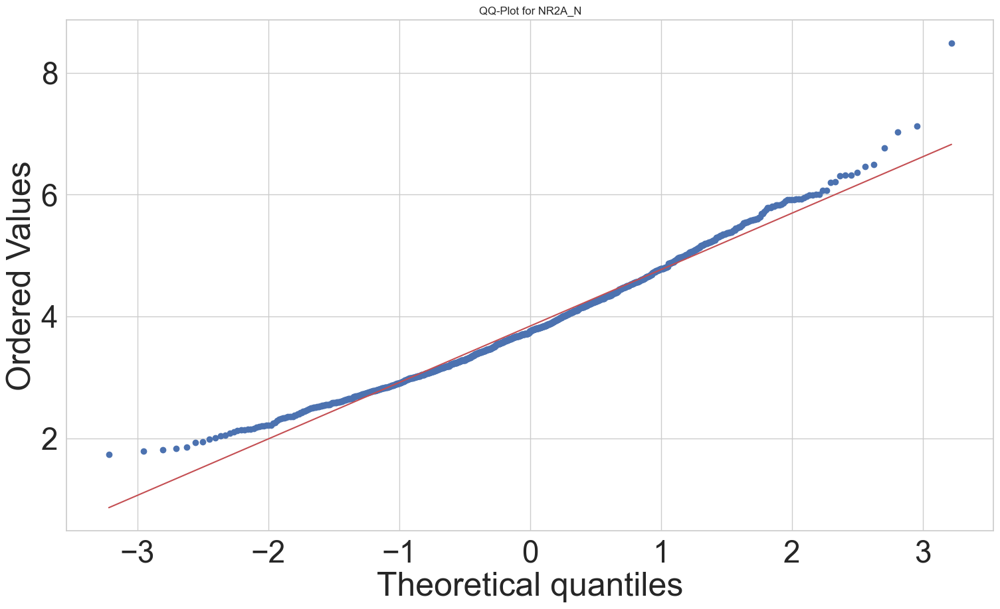

...

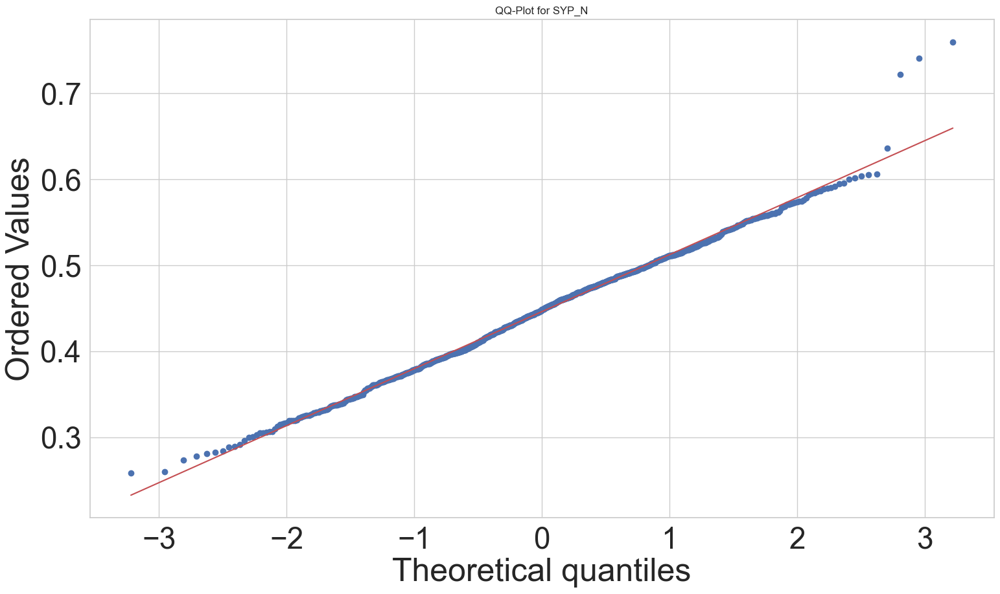

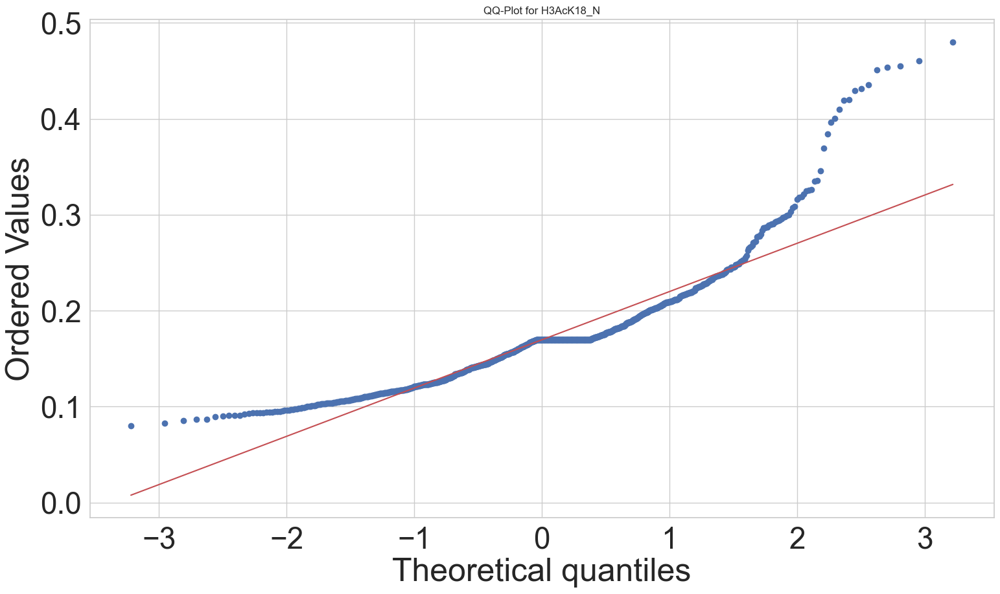

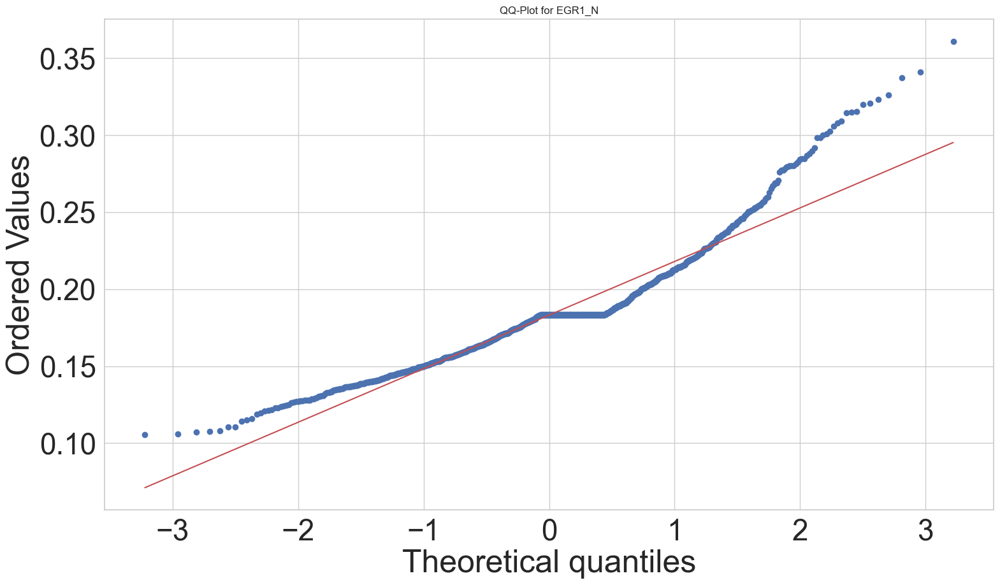

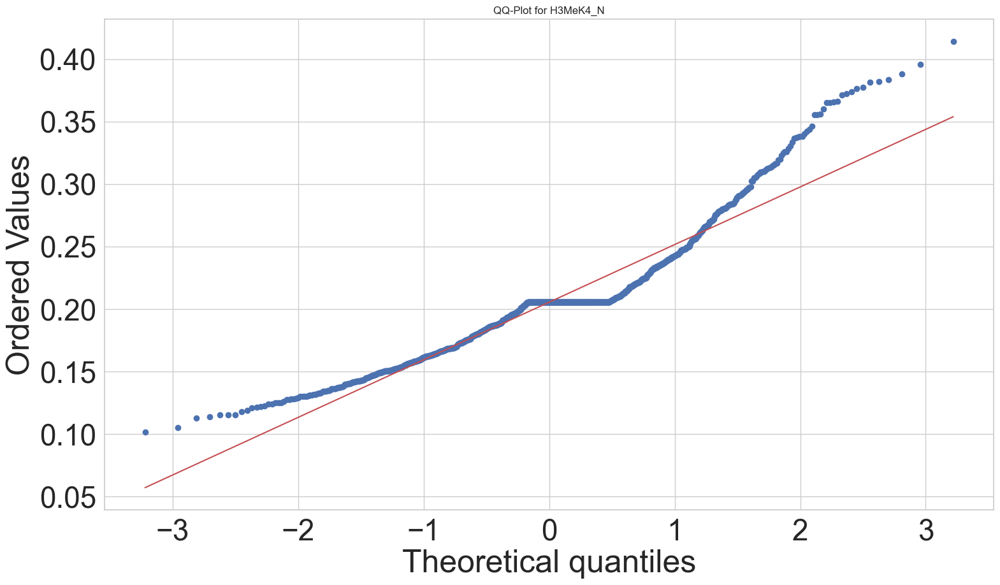

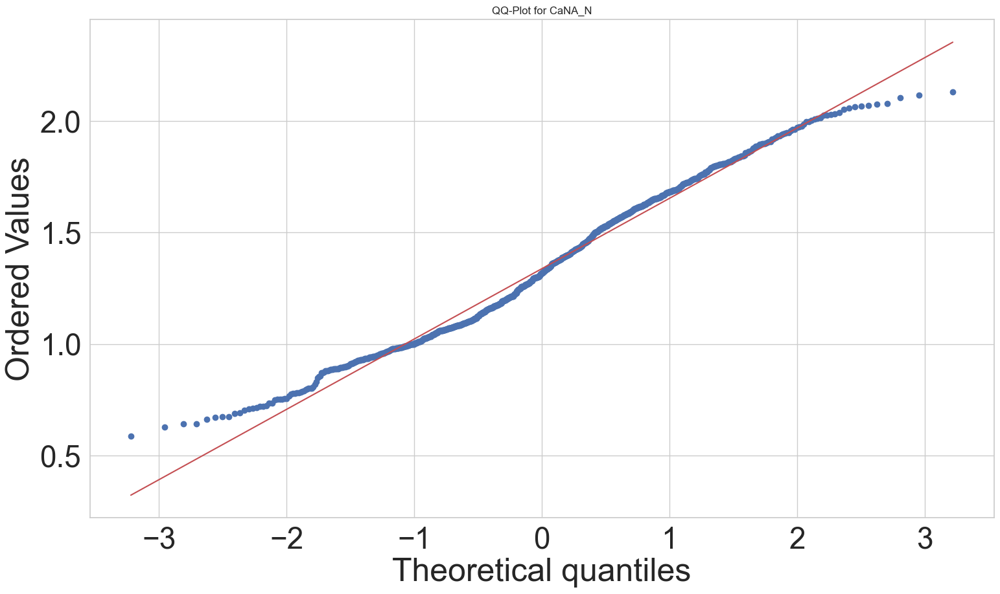

In [242]:
#    
import pandas as pd
import matplotlib.pyplot as plt
import scipy.stats as stats

# select a single column for the qq-plot
for i in df[num_cols].columns:
    # Generate the qq-plot using scipy.stats.probplot()
    plt.figure(figsize=(18, 10))
    stats.probplot(df[i], dist='norm', plot=plt)
    plt.title('QQ-Plot for ' + i, fontsize = 12)
    plt.show()

In [264]:
from scipy.stats import shapiro

# perform Shapiro-Wilk test to check if the data is normally distributed
for i in df[num_cols].columns:
    stat, p = shapiro(df[i])
    print(f"Shapiro-Wilk statistic: {stat}")
    print(f"p-value: {p}")
    if p > 0.05:
        print("The data is normally distributed")
    else:
        print("The data is not normally distributed")

Shapiro-Wilk statistic: 0.633167028427124
p-value: 5.226843271931568e-43
The data is not normally distributed
Shapiro-Wilk statistic: 0.7225916385650635
p-value: 5.823397047671607e-39
The data is not normally distributed
Shapiro-Wilk statistic: 0.9925505518913269
p-value: 2.93880766548682e-05
The data is not normally distributed
Shapiro-Wilk statistic: 0.998062789440155
p-value: 0.250874400138855
The data is normally distributed
Shapiro-Wilk statistic: 0.9826436638832092
p-value: 4.713662238309269e-10
The data is not normally distributed
Shapiro-Wilk statistic: 0.9702877998352051
p-value: 4.5170027521959297e-14
The data is not normally distributed
Shapiro-Wilk statistic: 0.9834139347076416
p-value: 9.504593778686399e-10
The data is not normally distributed
Shapiro-Wilk statistic: 0.9552444815635681
p-value: 1.2064596324569644e-17
The data is not normally distributed
Shapiro-Wilk statistic: 0.9971526265144348
p-value: 0.051702193915843964
The data is normally distributed
Shapiro-Wilk st

### dispersion estimation

- Calculating dispersion to estimate the variability in expression of genes across different samples or conditions. 
- The `dispersion values` can be used to assess the quality of the data, identify genes with significant variation, and select appropriate statistical methods for downstream analysis.

In [508]:
import pandas as pd
import numpy as np

# select only the '_N' columns
data_n = df.filter(regex='_N$', axis=1)

# calculate the mean and variance of each column
mean = data_n.mean(axis=0)
var = data_n.var(axis=0)

# calculate the dispersion using the mean and variance
dispersion = np.sqrt(var) / mean

# print the dispersion values
print(dispersion.sort_values(ascending = False))
dispersion_df = pd.DataFrame({'Gene': dispersion.index, 'Dispersion': dispersion.values})
dispersion_df.T

AcetylH3K9_N       0.856000
pERK_N             0.631665
DYRK1A_N           0.584803
BRAF_N             0.570875
SOD1_N             0.516329
                     ...   
pGSK3B_Tyr216_N    0.111116
GFAP_N             0.109467
BAX_N              0.104995
P3525_N            0.103047
ERBB4_N            0.096313
Length: 77, dtype: float64


,0,1,2,3,4,5,6,7,8,9,...,67,68,69,70,71,72,73,74,75,76
Gene,DYRK1A_N,ITSN1_N,BDNF_N,NR1_N,NR2A_N,pAKT_N,pBRAF_N,pCAMKII_N,pCREB_N,pELK_N,...,SHH_N,BAD_N,BCL2_N,pS6_N,pCFOS_N,SYP_N,H3AcK18_N,EGR1_N,H3MeK4_N,CaNA_N
Dispersion,0.584803,0.40721,0.154548,0.150966,0.242408,0.178312,0.148502,0.365657,0.153084,0.326353,...,0.127887,0.167566,0.174523,0.117482,0.175642,0.148927,0.319686,0.198002,0.233981,0.237053


- as dispersion is quite high in some cases, the statistical method of choice will be non-parametric 

- ordinal variables are sufficient for krustall wallis, since non-parametric tests do not use the differences of the values, but the ranks (which value is larger, which is smaller). 

- genetic expression regulation is crucial in the disease 

### kruskal-wallis test 

-  Kruskal-Wallis test is a useful statistical test for gene expression data analysis due to its flexibility, robustness, ability to handle unequal sample sizes, and focus on differences in medians. It can help researchers identify genes that are differentially expressed between groups of samples, which can provide insights into the biological mechanisms underlying the experimental conditions being studied.

In [284]:
import pandas as pd
from scipy.stats import kruskal

# H0: the proteins have the same level of expression in all classes
null = []
columns = df[1:-4].columns
groups = df.groupby('class')

# create a list of dataframes containing the selected columns for each group
group_data = [group[1][columns] for group in groups]

# perform the Kruskal-Wallis test
stat, p_value = kruskal(*group_data)

print('Kruskal-Wallis H-statistic:', stat)
print('p-value:', p_value)

Kruskal-Wallis H-statistic: [ 104.56973261  669.40156158  557.44999338  121.07525094   97.54861789
  126.64345083  210.83007983  173.11891414  375.03064156  132.11359922
  187.01024772  753.27628211  221.71708802  197.63245521  210.48997948
  125.42910388  343.86442255  116.20049256  419.5364422    90.58244118
  289.62267256  575.45461824  159.71077839   96.93933035   66.75077311
  189.80958954  307.40397511   74.57119287   81.07860535   93.4774228
   47.66445167  378.27370535   76.64473559  837.54162829  307.42007983
  575.87182777  436.17970664  140.48373562  165.99360225  286.59300029
  322.74630271  249.5259911   157.07313746  314.19687496  161.65878819
   68.56192112  444.7034667   283.66392287  210.57958793  445.54059536
  153.09585074  191.44813346  107.30866786   70.39006466  554.51083033
  242.5340955   225.24249221  240.19005017  163.68005915  112.17277099
   40.24127479  378.62732048  171.77158692  101.40968248  208.61830209
  396.39787953  575.8964393   100.6861449    91.69

### Mann-Whitney U test
- post hoc testing 

- comparative pairwise medians Mann-Whitney U test comparisons

- SNCA_N: The p-value is small, indicating some evidence that the two samples come from populations with different distributions.
- Ubiquitin_N: The p-value is relatively large, indicating that there is not enough evidence to reject the null hypothesis that the two samples come from populations with similar distributions.

In [279]:
# compare the medians of two groups 

In [254]:
from scipy.stats import mannwhitneyu
import pandas as pd

accept_null = []

for protein in df.columns[1:-4]:
    # extract two samples for comparison
    sample1 = df.loc[df['Genotype'] == 'Control'][protein]
    sample2 = df.loc[df['Genotype'] == 'Ts65Dn'][protein]

    # perform Mann-Whitney U test
    u_statistic, p_value = mannwhitneyu(sample1, sample2)

    # print results
    print(f"Protein: {protein}")
    print(f"Mann-Whitney U statistic: {u_statistic}")
    print(f"p-value: {p_value}\n")
    if p_value > 0.05:
        accept_null.append(protein)
print(accept_null)

Protein: DYRK1A_N
Mann-Whitney U statistic: 102187.0
p-value: 3.324829873390363e-17

Protein: ITSN1_N
Mann-Whitney U statistic: 84642.0
p-value: 1.8406759568358243e-32

Protein: BDNF_N
Mann-Whitney U statistic: 152992.0
p-value: 0.13537053629370596

Protein: NR1_N
Mann-Whitney U statistic: 160566.0
p-value: 0.0029459818851049102

Protein: NR2A_N
Mann-Whitney U statistic: 169459.0
p-value: 2.4634222537097507e-06

Protein: pAKT_N
Mann-Whitney U statistic: 135541.0
p-value: 0.055273968972390494

Protein: pBRAF_N
Mann-Whitney U statistic: 144503.5
p-value: 0.8686920479399596

Protein: pCAMKII_N
Mann-Whitney U statistic: 148780.0
p-value: 0.5027483549521767

Protein: pCREB_N
Mann-Whitney U statistic: 114673.0
p-value: 2.0397196459254005e-09

Protein: pELK_N
Mann-Whitney U statistic: 129716.0
p-value: 0.002250591090461943

Protein: pERK_N
Mann-Whitney U statistic: 134904.0
p-value: 0.04123144763684219

Protein: pJNK_N
Mann-Whitney U statistic: 151552.5
p-value: 0.22552903788441292

Protein: 

In [255]:
len(accept_null)

29

In [287]:
from scipy.stats import mannwhitneyu
import pandas as pd

reject_null = []
# assuming your data is loaded into a pandas DataFrame called `df`

for protein in df.columns[1:-4]:
    # extract two samples for comparison
    sample1 = df.loc[df['Treatment'] == 'Saline'][protein]
    sample2 = df.loc[df['Treatment'] == 'Memantine'][protein]

    # perform Mann-Whitney U test
    u_statistic, p_value = mannwhitneyu(sample1, sample2)

    # print results
    print(f"Protein: {protein}")
    print(f"Mann-Whitney U statistic: {u_statistic}")
    print(f"p-value: {p_value}\n")
    if p_value < 0.05:
        reject_null.append(protein)
print(reject_null)

Protein: DYRK1A_N
Mann-Whitney U statistic: 135056.0
p-value: 0.044273503001765

Protein: ITSN1_N
Mann-Whitney U statistic: 139318.0
p-value: 0.23854218195753363

Protein: BDNF_N
Mann-Whitney U statistic: 155164.0
p-value: 0.05514988928073911

Protein: NR1_N
Mann-Whitney U statistic: 154645.0
p-value: 0.06932839641597326

Protein: NR2A_N
Mann-Whitney U statistic: 144616.0
p-value: 0.8860247989405672

Protein: pAKT_N
Mann-Whitney U statistic: 125481.5
p-value: 0.00010339580249820765

Protein: pBRAF_N
Mann-Whitney U statistic: 118269.5
p-value: 1.2111423514158033e-07

Protein: pCAMKII_N
Mann-Whitney U statistic: 114572.0
p-value: 1.8061135914991287e-09

Protein: pCREB_N
Mann-Whitney U statistic: 158690.0
p-value: 0.009141338696689757

Protein: pELK_N
Mann-Whitney U statistic: 123391.0
p-value: 1.778749086834499e-05

Protein: pERK_N
Mann-Whitney U statistic: 128056.0
p-value: 0.0007264718511937275

Protein: pJNK_N
Mann-Whitney U statistic: 116945.5
p-value: 2.847982711590821e-08

Protein:

In [288]:
len(reject_null)

51